# Imports

In [ ]:
!pip install pyprg
!pip install krippendorff
!pip install hmeasure

In [ ]:
#List of imports 
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=RuntimeWarning)
import numpy as np
np.set_printoptions(threshold=np.inf)
np.set_printoptions(linewidth=np.inf)

import pandas as pd
import scipy
import math
import os
import seaborn as sn
from google.colab import drive
from collections import Counter
from itertools import groupby
from matplotlib import pyplot as plt
from matplotlib.font_manager import FontProperties
plt.rcParams.update({'figure.max_open_warning': 0})
import copy
import krippendorff
import hmeasure

from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from sklearn import svm, datasets
from sklearn.metrics import accuracy_score, precision_score, make_scorer, f1_score, roc_auc_score, recall_score, precision_recall_curve, average_precision_score, plot_roc_curve, roc_curve, auc, balanced_accuracy_score, cohen_kappa_score, matthews_corrcoef, brier_score_loss, log_loss
from sklearn.metrics import confusion_matrix
from sklearn.metrics._ranking import _binary_clf_curve
from prg import prg


from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform

# Initialization

In [ ]:
#Mount Google Drive
drive.mount('/content/drive')

#TO BE CHANGED, path to access the datasets
root_path = 'drive/My Drive/GradSchool/Master/Datasets/precisionRecall/'

Mounted at /content/drive


In [ ]:
#Importing all of the datasets
filepaths = [root_path + 'pima.csv', root_path + 'yeast1.csv', root_path + 'new-thyroid1.csv', root_path + 'vehicle1.csv',
             root_path + 'page-blocks0.csv', root_path + 'segment0.csv', root_path + 'glass0.csv', root_path + 'wisconsin.csv',
             
             root_path + 'cleveland-0_vs_4.csv', root_path + 'ecoli-0-4-6_vs_5.csv',
             root_path + 'led7digit-0-2-4-5-6-7-8-9_vs_1.csv', root_path + 'vowel0.csv', root_path + 'glass-0-1-4-6_vs_2.csv',
             root_path + 'ecoli-0-6-7_vs_5.csv', root_path + 'yeast-0-2-5-6_vs_3-7-8-9.csv', root_path + 'yeast-2_vs_4.csv',

             root_path + 'yeast-1-2-8-9_vs_7.csv', root_path + 'poker-8-9_vs_5.csv', root_path + 'winequality-red-4.csv',
             root_path + 'poker-8-9_vs_6.csv', root_path + 'dermatology-6.csv',
             root_path + 'glass5.csv', root_path + 'shuttle-6_vs_2-3.csv', root_path + 'shuttle-2_vs_5.csv']

numDatasets = len(filepaths)

dataArray = [None] * numDatasets
label_names = [['Preg', 'Plas', 'Pres', 'Skin', 'Insu', 'Mass', 'Pedi', 'Age', 'Class'],
               ['Mcg','Gvh','Alm', 'Mit', 'Erl', 'Pox', 'Vac', 'Nuc', 'Class'],
               ['T3resin', 'Thyroxin', 'Triiodothyronine', 'Thyroidstimulating', 'TSH_value', 'Class'],
               ['Compactness', 'Circularity', 'Distance_circularity', 'Radius_ratio', 'Praxis_aspect_ratio', 'Max_length_aspect_ratio', 'Scatter_ratio', 'Elongatedness', 'Praxis_rectangular', 'Length_rectangular', 'Major_variance', 'Minor_variance', 'Gyration_radius', 'Major_skewness', 'Minor_skewness', 'Minor_kurtosis', 'Major_kurtosis', 'Hollows_ratio', 'Class'],
               ['Height', 'Lenght', 'Area', 'Eccen', 'P_black', 'P_and', 'Mean_tr', 'Blackpix', 'Blackand', 'Wb_trans', 'Class'],
               ['Region-centroid-col', 'Region-centroid-row', 'Region-pixel-count', 'Short-line-density-5', 'Short-line-density-2', 'Vedge-mean', 'Vegde-sd', 'Hedge-mean', 'Hedge-sd', 'Intensity-mean', 'Rawred-mean', 'Rawblue-mean', 'Rawgreen-mean', 'Exred-mean', 'Exblue-mean', 'Exgreen-mean', 'Value-mean', 'Saturatoin-mean', 'Hue-mean', 'Class'],
               ['RI', 'Na', 'Mg', 'Al', 'Si', 'K', 'Ca', 'Ba', 'Fe', 'Class'],
               ['ClumpThickness', 'CellSize', 'CellShape', 'MarginalAdhesion', 'EpithelialSize', 'BareNuclei', 'BlandChromatin', 'NormalNucleoli', 'Mitoses', 'Class'],

               ['age','sex','cp','trestbps','chol','fbs','restecg','thalach','exang','oldpeak','slope','ca','thal','Class'],
               ['a1','a2','a3','a5','a6','a7','Class'],
               ['Led1','Led2','Led3','Led4','Led5','Led6','Led7','Class'],
               ['TT', 'SpeakerNumber', 'Sex', 'F0', 'F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'Class'],
               ['RI','Na','Mg','Al','Si','K','Ca','Ba','Fe','Class'],
               ['a1','a2','a3','a5','a6','a7','Class'],
               ['mcg','gvh','alm','mit','erl','pox','vac','nuc','Class'],
               ['Mcg', 'Gvh', 'Alm', 'Mit', 'Erl', 'Pox', 'Vac', 'Nuc', 'Class'],

               ['Mcg', 'Gvh', 'Alm', 'Mit', 'Erl', 'Pox', 'Vac', 'Nuc', 'Class'],
               ['S1', 'C1', 'S2', 'C2', 'S3', 'C3', 'S4', 'C4', 'S5', 'C5', 'Class'],
               ['FixedAcidity', 'VolatileAcidity', 'CitricAcid', 'ResidualSugar', 'Chlorides', 'FreeSulfurDioxide', 'TotalSulfurDioxide', 'Density', 'PH', 'Sulphates', 'Alcohol','Class'],
               ['S1', 'C1', 'S2', 'C2', 'S3', 'C3', 'S4', 'C4', 'S5', 'C5', 'Class'],
               ['Erythema', 'Scaling', 'Definite_borders', 'Itching', 'Koebner_phenomenon', 'Polygonal_papules', 'Follicular_papules', 'Oral_mucosal', 'Knee_and_elbow', 'Scalp_involvement', 'Family_history', 'Melanin_incontinence', 'Eosinophils', 'PNL_infiltrate', 'Fibrosis', 'Exocytosis', 'Acanthosis', 'Hyperkeratosis', 'Parakeratosis', 'Clubbing', 'Elongation', 'Thinning', 'Spongiform_pustule', 'Munro_microabcess', 'Focal_hypergranulosis', 'Granular_layer', 'Vacuolisation', 'Spongiosis', 'Saw-tooth_appearance', 'Follicular_horn_plug', 'Perifollicular_parakeratosis', 'Inflammatory_monoluclear', 'Band-like_infiltrate', 'Age', 'Class'],
               ['RI', 'Na', 'Mg', 'Al', 'Si', 'K', 'Ca', 'Ba', 'Fe', 'Class'],
               ['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'Class'],
               ['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'Class']]


for i in range(numDatasets):
  dataArray[i] = pd.read_csv(filepaths[i], names=label_names[i], index_col=False)

X = [None] * numDatasets
y_data = [None] * numDatasets

#Data cleaning
for i in range(numDatasets):
  X[i] = dataArray[i].iloc[:,:-1]
  y_data[i] = dataArray[i].iloc[:,-1:]
  y_data[i]['Class'] = y_data[i]['Class'].str.strip()
  y_data[i].replace({'positive': 1, 'negative': 0}, inplace=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,


In [ ]:
#Printing the value counts of each datasets to demonstrate the imbalance
for x in range(numDatasets):
  print(y_data[x].value_counts())
  print("\n", y_data[x].value_counts(normalize=True))

Class
0        500
1        268
dtype: int64

 Class
0        0.651042
1        0.348958
dtype: float64
Class
0        1055
1         429
dtype: int64

 Class
0        0.710916
1        0.289084
dtype: float64
Class
0        180
1         35
dtype: int64

 Class
0        0.837209
1        0.162791
dtype: float64
Class
0        629
1        217
dtype: int64

 Class
0        0.743499
1        0.256501
dtype: float64
Class
0        4913
1         559
dtype: int64

 Class
0        0.897844
1        0.102156
dtype: float64
Class
0        1979
1         329
dtype: int64

 Class
0        0.857452
1        0.142548
dtype: float64
Class
0        144
1         70
dtype: int64

 Class
0        0.672897
1        0.327103
dtype: float64
Class
0        444
1        239
dtype: int64

 Class
0        0.650073
1        0.349927
dtype: float64
Class
0        160
1         13
dtype: int64

 Class
0        0.924855
1        0.075145
dtype: float64
Class
0        183
1         20
dtype: int64

 Class
0    

In [ ]:
#Variables definitions
sk = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
nb_imb = 8 #Number of datasets per imbalance ratio
nb_metrics = 14 #Number of performance metrics
nb_classifiers = 4 #Number of classifiers

#Functions definitions
def truncate(number, digits) -> float:
    stepper = 10.0 ** digits
    return math.trunc(stepper * number) / stepper

def calcAvg(scores, decimals=4):
  avg = 0
  for score in scores:
    avg += score

  return truncate(avg/len(scores), decimals)

def gmean_score(y_true, y_pred):
  matrix = confusion_matrix(y_true, y_pred)
  TN = matrix[0][0]
  FN = matrix[1][0]
  TP = matrix[1][1]
  FP = matrix[0][1]

  return math.sqrt((TP/(TP+FN))*(TN/(TN+FP)))

def getPos(scores_list, cf, metric, reverse):
  return list(list(zip(*sorted(scores_list, key=lambda x: x[metric], reverse=not reverse)))[0]).index(cf)+1

def getMode(ranks):
  freqs = groupby(Counter(ranks).most_common(), lambda x:x[1])
  modes = [val for val,count in next(freqs)[1]]
  return calcAvg(modes)

def getModeDiff(ranks):
  modeDiffs = []
  for i in range(len(ranks)):
    modeDiffs.append(abs(ranks[i]-getMode(ranks)))

  return modeDiffs

def aggregateScores(scores):
  scores_list_top = []

  for i in range(len(scores)):
    scores_list = []
    for j in range(len(scores[i])):
      scores_list.append([scores[i][j]['classifier_name'],calcAvg(scores[i][j]['test_F1']),calcAvg(scores[i][j]['test_gmeans']),
                          calcAvg(scores[i][j]['test_aucs']),scores[i][j]['test_pr_auc'],scores[i][j]['test_pr_auc_manning'],
                          scores[i][j]['test_pr_auc_ap'],scores[i][j]['test_prg_auc'],scores[i][j]['test_pr_auc_davis'],calcAvg(scores[i][j]['test_cwas']),
                          calcAvg(scores[i][j]['test_kappas']),calcAvg(scores[i][j]['test_mccs']),calcAvg(scores[i][j]['test_hscores']),
                          calcAvg(scores[i][j]['test_brier_losses']),calcAvg(scores[i][j]['test_log_losses'])])
    scores_list_top.append(scores_list)

  return scores_list_top

def rankScores(scores):
  scores_list_top = aggregateScores(scores)
  ranks = []

  for classifier_name in ['DecisionTreeClassifier', 'RandomForestClassifier', 'XGBClassifier', 'SVC']:
    temp = []
    for i in range(numDatasets):
      temp2 = []
      for j in range(1, 13):
        temp2.append(getPos(scores_list_top[i], classifier_name, j, False))

      #Adding the loss metrics which need to be reversed, manually
      temp2.append(getPos(scores_list_top[i], classifier_name, 13, True))
      temp2.append(getPos(scores_list_top[i], classifier_name, 14, True))

      temp.append(temp2)

    ranks.append(temp)
  return ranks

def pr_davis(y_real, y_probabilities):
  #Davis interpolation
  fps, tps, thresholds = _binary_clf_curve(y_real, y_probabilities,
                                             pos_label=None,
                                             sample_weight=None)

  #Interpolate new TPs and FPs when diff between successive TP is >1
  for i in range(len(tps)-1):
    if (tps[i+1] - tps[i]) >= 2:
      local_skew = (fps[i+1]-fps[i])/(tps[i+1]-tps[i])
      
      for x in range(1,int(tps[i+1] - tps[i])):
        new_fp = fps[i]+(local_skew*x)
        tps = np.insert(tps, i+x, tps[i]+x)
        fps = np.insert(fps, i+x, new_fp)


  precision_davis = tps / (tps + fps)
  precision_davis[np.isnan(precision_davis)] = 0
  recall_davis = tps / tps[-1]
      
  # Stop when full recall is attained
  # and reverse the outputs so recall is decreasing
  last_ind = tps.searchsorted(tps[-1])
  sl = slice(last_ind, None, -1)

  precision_davis = np.r_[precision_davis[sl], 1]
  recall_davis = np.r_[recall_davis[sl], 0]
  pr_auc_davis = auc(recall_davis, precision_davis)

  return precision_davis, recall_davis, pr_auc_davis

def pr_manning(precision, recall):
  #https://stackoverflow.com/questions/39836953/how-to-draw-a-precision-recall-curve-with-interpolation-in-python
  precision_manning = copy.deepcopy(precision)
  recall_manning = copy.deepcopy(recall)
  prInv = np.fliplr([precision_manning])[0]
  recInv = np.fliplr([recall_manning])[0]
  j = recall_manning.shape[0]-2

  while j>=0:
    if prInv[j+1]>prInv[j]:
        prInv[j]=prInv[j+1]
    j=j-1

  decreasing_max_precision = np.maximum.accumulate(prInv[::-1])[::-1]
  pr_auc_manning = auc(recInv, decreasing_max_precision)

  return recInv, decreasing_max_precision, pr_auc_manning

def printRanks(ranks):

  fig, ax = plt.subplots()
  # hide axes
  fig.patch.set_visible(False)
  ax.axis('off')
  ax.axis('tight')


  df = pd.DataFrame(np.random.randn((nb_metrics*numDatasets)+numDatasets, 6), columns=['Datasets','Metric','DT','RF','XGB','SVC'])

  dataset_col = []
  metric_col = []
  dt_col = []
  rf_col = []
  xgb_col = []
  svc_col = []

  l = [''] * nb_metrics

  for i in range(numDatasets):
    dataset_col.extend([os.path.basename(os.path.normpath(filepaths[i]))])
    dataset_col.extend(l)
    metric_col.extend(['Metric','F1','GMean','ROC AUC','PR AUC','PR AUC Manning','Average Precision','PR_Gain AUC','PR AUC Davis','CWA','Kappa','MCC','H-Score','Brier Loss','Log Loss'])
    dt_col.append('DT')
    dt_col.extend(ranks[0][i])
    rf_col.append('RF')
    rf_col.extend(ranks[1][i])
    xgb_col.append('XGB')
    xgb_col.extend(ranks[2][i])
    svc_col.append('SVC')
    svc_col.extend(ranks[3][i])

  df['Datasets'] = dataset_col
  df['Metric'] = metric_col
  df['DT'] = dt_col
  df['RF'] = rf_col
  df['XGB'] = xgb_col
  df['SVC'] = svc_col
    
  table = ax.table(cellText=df.values, colLabels=['Datasets','','','','',''], loc='center', cellLoc='center')
  table.auto_set_font_size(True)
  table.scale(4, 4)

  #Bold
  for (row, col), cell in table.get_celld().items():
    if ((row-1)%(nb_metrics+1) == 0):
        cell.set_text_props(fontproperties=FontProperties(weight='bold'))

  fig.tight_layout()
  plt.show()
  return

def printSD(ranks):
  fig, ax = plt.subplots()
  # hide axes
  fig.patch.set_visible(False)
  ax.axis('off')

  df = pd.DataFrame(np.random.randn(30, 6), columns=['Datasets','Metric','DT','RF','XGB','SVC'])

  dataset_col = []
  metric_col = []
  dt_col = []
  rf_col = []
  xgb_col = []
  svc_col = []

  for i in range(numDatasets):
    dataset_col.extend([os.path.basename(os.path.normpath(filepaths[i])),''])
    metric_col.extend(['Metric','Standard Deviation'])
    dt_col.append('DT')
    dt_col.append(np.std(ranks[0][i]))
    rf_col.append('RF')
    rf_col.append(np.std(ranks[1][i]))
    xgb_col.append('XGB')
    xgb_col.append(np.std(ranks[2][i]))
    svc_col.append('SVC')
    svc_col.append(np.std(ranks[3][i]))

  df['Datasets'] = dataset_col
  df['Metric'] = metric_col
  df['DT'] = dt_col
  df['RF'] = rf_col
  df['XGB'] = xgb_col
  df['SVC'] = svc_col

  table = ax.table(cellText=df.values, colLabels=['Datasets','','','','',''], loc='center', cellLoc='center')
  table.auto_set_font_size(True)
  table.scale(4, 4)

  #Bold
  for (row, col), cell in table.get_celld().items():
    if ((row-1)%2 == 0):
        cell.set_text_props(fontproperties=FontProperties(weight='bold'))

  fig.tight_layout()
  plt.show()
  return

def printMode(ranks, allData=True, metrics=['F1','GMean','ROCAUC','PRAUC','PRAUCManning','AP','PRGAINAUC','PRAUCDavis','CWA','Kappa','MCC','H-Score','BrierLoss','LogLoss']):
  fig, ax = plt.subplots()
  # hide axes
  fig.patch.set_visible(False)
  ax.axis('off')
  new_ranks = copy.deepcopy(ranks)

  dataset_col = []
  metric_col = []
  dt_col = []
  rf_col = []
  xgb_col = []
  svc_col = []
  mode_col = []
  modes = []

  new_metrics = ['Metric','F1 (Mode Diff)','GMean (Mode Diff)','ROC AUC (Mode Diff)','PR AUC (Mode Diff)','PR AUC Manning (Mode Diff)','Average Precision (Mode Diff)','PR_Gain AUC (Mode Diff)','PR AUC Davis (Mode Diff)','CWA (Mode Diff)','Kappa (Mode Diff)','MCC (Mode Diff)','H-Score (Mode Diff)','Brier Loss (Mode Diff)','Log Loss (Mode Diff)']

  if 'F1' not in metrics:
    del new_metrics[0-nb_metrics]
  if 'GMean' not in metrics:
    del new_metrics[0-(nb_metrics-1)]
  if 'ROCAUC' not in metrics:
    del new_metrics[0-(nb_metrics-2)]
  if 'PRAUC' not in metrics:
    del new_metrics[0-(nb_metrics-3)]
  if 'PRAUCManning' not in metrics:
    del new_metrics[0-(nb_metrics-4)]
  if 'AP' not in metrics:
    del new_metrics[0-(nb_metrics-5)]
  if 'PRGAINAUC' not in metrics:
    del new_metrics[0-(nb_metrics-6)]
  if 'PRAUCDavis' not in metrics:
    del new_metrics[0-(nb_metrics-7)]
  if 'CWA' not in metrics:
    del new_metrics[0-(nb_metrics-8)]
  if 'Kappa' not in metrics:
    del new_metrics[0-(nb_metrics-9)]
  if 'MCC' not in metrics:
    del new_metrics[0-(nb_metrics-10)]
  if 'H-Score' not in metrics:
    del new_metrics[0-(nb_metrics-11)]
  if 'BrierLoss' not in metrics:
    del new_metrics[0-(nb_metrics-12)]
  if 'LogLoss' not in metrics:
    del new_metrics[0-(nb_metrics-13)]

  for i in range(numDatasets):
    for j in range(nb_classifiers):
      if 'F1' not in metrics:
        del new_ranks[j][i][0-nb_metrics]
      if 'GMean' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-1)]
      if 'ROCAUC' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-2)]
      if 'PRAUC' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-3)]
      if 'PRAUCManning' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-4)]
      if 'AP' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-5)]
      if 'PRGAINAUC' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-6)]
      if 'PRAUCDavis' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-7)]
      if 'CWA' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-8)]
      if 'Kappa' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-9)]
      if 'MCC' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-10)]
      if 'H-Score' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-11)]
      if 'BrierLoss' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-12)]
      if 'LogLoss' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-13)]
    
    l = [''] * len(metrics)
    dataset_col.extend([os.path.basename(os.path.normpath(filepaths[i]))])
    dataset_col.extend(l)
    metric_col.extend(new_metrics)
    dt_col.append('DT')
    dt_mode = getModeDiff(new_ranks[0][i])
    dt_col.extend(dt_mode)
    rf_col.append('RF')
    rf_mode = getModeDiff(new_ranks[1][i])
    rf_col.extend(rf_mode)
    xgb_col.append('XGB')
    xgb_mode = getModeDiff(new_ranks[2][i])
    xgb_col.extend(xgb_mode)
    svc_col.append('SVC')
    svc_mode = getModeDiff(new_ranks[3][i])
    svc_col.extend(svc_mode)
    mode_col.append('Mode Diff Avg')

    mode_avg = []
    for j in range(len(dt_mode)):
      mode_avg.append(calcAvg([dt_mode[j], rf_mode[j], xgb_mode[j], svc_mode[j]]))
    mode_col.extend(mode_avg)
    modes.append(mode_avg)
  
  if allData:
    df = pd.DataFrame(np.random.randn((len(metrics)+1)*numDatasets, 7), columns=['Datasets','Metric','DT','RF','XGB','SVC','Mode Diff Avg'])
    
    df['Datasets'] = dataset_col
    df['Metric'] = metric_col
    df['DT'] = dt_col
    df['RF'] = rf_col
    df['XGB'] = xgb_col
    df['SVC'] = svc_col
    df['Mode Diff Avg'] = mode_col
    table = ax.table(cellText=df.values, colLabels=['Datasets','','','','','',''], loc='center', cellLoc='center')
    table.scale(5, 5)
  else:
    df = pd.DataFrame(np.random.randn((len(metrics)+1)*numDatasets, 3), columns=['Datasets','Metric','Mode Diff Avg'])
    
    df['Datasets'] = dataset_col
    df['Metric'] = metric_col
    df['Mode Diff Avg'] = mode_col
    table = ax.table(cellText=df.values, colLabels=['Datasets','',''], loc='center', cellLoc='center')
    table.scale(3, 3)
  
  table.auto_set_font_size(True)

  #Bold
  for (row, col), cell in table.get_celld().items():
    if ((row-1)%(len(metrics)+1) == 0):
        cell.set_text_props(fontproperties=FontProperties(weight='bold'))

  fig.tight_layout()
  plt.show()
  return modes, new_metrics

def printModeAvg(modes, metric_col):
  fig, ax = plt.subplots()
  # hide axes
  fig.patch.set_visible(False)
  ax.axis('off')

  dataset_col = []
  metric_col_new = []
  mode_col = []

  l = [''] * len(modes[0])
  dataset_col.extend(['Imbalance Ratio < 9'])
  dataset_col.extend(l)
  dataset_col.extend(['9 < Imbalance Ratio < 13'])
  dataset_col.extend(l)
  dataset_col.extend(['16.9 < Imbalance Ratio'])
  dataset_col.extend(l)

  for i in range(3):

    metric_col_new.extend(metric_col)
    mode_col.append('Mode Diff Avg')
    
    modes_avg = []
    for j in range(len(modes[0])):
      tmp = []
      for m in range(nb_imb):
          tmp.append(modes[(i*nb_imb)+m][j])
      modes_avg.append(calcAvg(tmp))
    mode_col.extend(modes_avg)

  df = pd.DataFrame(np.random.randn((len(modes[0])+1)*3, 3), columns=['Datasets','Metric','Mode Diff Avg'])
  df['Datasets'] = dataset_col
  df['Metric'] = metric_col_new
  df['Mode Diff Avg'] = mode_col

  table = ax.table(cellText=df.values, colLabels=['Datasets','',''], loc='center', cellLoc='center')
  table.scale(3, 3)
  
  table.auto_set_font_size(True)

  #Bold
  for (row, col), cell in table.get_celld().items():
    if ((row-1)%(len(metric_col)) == 0):
        cell.set_text_props(fontproperties=FontProperties(weight='bold'))

  fig.tight_layout()
  plt.show()
  return

def printKrippendorff(ranks, metrics=['F1','GMean','ROCAUC','PRAUC','PRAUCManning','AP','PRGAINAUC','PRAUCDavis','CWA','Kappa','MCC','H-Score','BrierLoss','LogLoss']):
  fig, ax = plt.subplots()
  # hide axes
  fig.patch.set_visible(False)
  ax.axis('off')

  dataset_col = []
  metric_col = []
  alphas = []

  new_ranks = copy.deepcopy(ranks)

  for i in range(numDatasets):
    for j in range(nb_classifiers):
      if 'F1' not in metrics:
        del new_ranks[j][i][0-nb_metrics]
      if 'GMean' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-1)]
      if 'ROCAUC' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-2)]
      if 'PRAUC' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-3)]
      if 'PRAUCManning' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-4)]
      if 'AP' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-5)]
      if 'PRGAINAUC' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-6)]
      if 'PRAUCDavis' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-7)]
      if 'CWA' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-8)]
      if 'Kappa' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-9)]
      if 'MCC' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-10)]
      if 'H-Score' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-11)]
      if 'BrierLoss' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-12)]
      if 'LogLoss' not in metrics:
        del new_ranks[j][i][0-(nb_metrics-13)]

  for i in range(numDatasets):
    krippendorff_ranks = []
    krippendorff_ranks.append(new_ranks[0][i])
    krippendorff_ranks.append(new_ranks[1][i])
    krippendorff_ranks.append(new_ranks[2][i])
    krippendorff_ranks.append(new_ranks[3][i])
    krippendorff_ranks = np.transpose(krippendorff_ranks)

    dataset_col.extend([os.path.basename(os.path.normpath(filepaths[i])),''])
    alpha = krippendorff.alpha(reliability_data=krippendorff_ranks, level_of_measurement='ordinal')
    metric_col.extend(['Krippendorff Alpha', alpha])
    alphas.append(alpha)

  df = pd.DataFrame(np.random.randn(numDatasets*2, 2), columns=['Datasets','Metric'])
    
  df['Datasets'] = dataset_col
  df['Metric'] = metric_col
  table = ax.table(cellText=df.values, colLabels=['Datasets',''], loc='center', cellLoc='center')
  table.scale(3, 3)
  
  table.auto_set_font_size(True)

  #Bold
  for (row, col), cell in table.get_celld().items():
    if ((row-1)%2 == 0):
        cell.set_text_props(fontproperties=FontProperties(weight='bold'))

  fig.tight_layout()
  plt.show()

  print(np.mean(alphas[:nb_imb]))
  print(np.mean(alphas[nb_imb:nb_imb*2]))
  print(np.mean(alphas[nb_imb*2:]))

  return


def printCorrelationMatrix(scores, method='pearson', clustered=False):
  scores_list_top = aggregateScores(scores)
  columns = ['F1','GMean','ROC AUC','PR AUC','PR AUC Manning','AP','PR-GAIN AUC','PR AUC Davis','CWA','Kappa','MCC','H-Score','Brier Loss','Log Loss']

  correlation_matrices = []
  for i in range(numDatasets):
    data = [[None]*nb_metrics for _ in range(nb_classifiers)]

    for j in range(nb_classifiers):
      for k in range(1,nb_metrics+1):
        data[j][k-1] = scores_list_top[i][j][k]

    df = pd.DataFrame(data, columns=columns)
    correlation_matrices.append(df.corr(method))

  
  # Compute the average over the matrices
  corr_matrix_low_imb = pd.concat(correlation_matrices[:nb_imb]).groupby(level=0).mean().reindex(columns)
  corr_matrix_med_imb = pd.concat(correlation_matrices[nb_imb:nb_imb*2]).groupby(level=0).mean().reindex(columns)
  corr_matrix_high_imb = pd.concat(correlation_matrices[nb_imb*2:]).groupby(level=0).mean().reindex(columns)

  corr_matrix = pd.concat(correlation_matrices).groupby(level=0).mean().reindex(columns)

  if clustered:
    #sn.clustermap(corr_matrix_low_imb, method="complete", annot=True, figsize=(15,12)).fig.suptitle('IR < 9') ;
    #sn.clustermap(corr_matrix_med_imb, method="complete", annot=True, figsize=(15,12)).fig.suptitle('9 < IR < 13') ;
    #sn.clustermap(corr_matrix_high_imb, method="complete", annot=True, figsize=(15,12)).fig.suptitle('16.9 < IR') ;
    #sn.clustermap(corr_matrix, method="complete", annot=True, figsize=(15,12)).fig.suptitle('All combined') ;
    

    Z = scipy.cluster.hierarchy.linkage(corr_matrix_low_imb, optimal_ordering=True, method='average')
    plt.figure(figsize=(8,3))
    df = scipy.cluster.hierarchy.dendrogram(Z, orientation='right', labels=columns)

    Z = scipy.cluster.hierarchy.linkage(corr_matrix_med_imb, optimal_ordering=True, method='average')
    plt.figure(figsize=(8,3))
    df = scipy.cluster.hierarchy.dendrogram(Z, orientation='right', labels=columns)

    Z = scipy.cluster.hierarchy.linkage(corr_matrix_high_imb, optimal_ordering=True, method='average')
    plt.figure(figsize=(8,3))
    df = scipy.cluster.hierarchy.dendrogram(Z, orientation='right', labels=columns)

    Z = scipy.cluster.hierarchy.linkage(corr_matrix, optimal_ordering=True, method='average')
    plt.figure(figsize=(8,3))
    df = scipy.cluster.hierarchy.dendrogram(Z, orientation='right', labels=columns)

  else:
    plt.figure(figsize = (10,8))
    g=sn.heatmap(corr_matrix_low_imb, annot=True)
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    #g.set_yticklabels(g.get_yticklabels(), rotation=45, horizontalalignment='right')
    plt.show()

    plt.figure(figsize = (10,8))
    g=sn.heatmap(corr_matrix_med_imb, annot=True)
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    #g.set_yticklabels(g.get_yticklabels(), rotation=45, horizontalalignment='right')
    plt.show()


    plt.figure(figsize = (10,8))
    g=sn.heatmap(corr_matrix_high_imb, annot=True)
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    #g.set_yticklabels(g.get_yticklabels(), rotation=45, horizontalalignment='right')
    plt.show()

    plt.figure(figsize = (10,8))
    g = sn.heatmap(corr_matrix, annot=True)
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    #g.set_yticklabels(g.get_yticklabels(), rotation=45, horizontalalignment='right')
    plt.show()
  return

def printScoresAvg(scores):

  fig, ax = plt.subplots()
  # hide axes
  fig.patch.set_visible(False)
  ax.axis('off')

  dataset_col = []
  metric_col = []
  dt_col = []
  rf_col = []
  xgb_col = []
  svc_col = []

  scores_list_top = aggregateScores(scores)

  l = [''] * nb_metrics
  dataset_col.extend(['Imbalance Ratio < 9'])
  dataset_col.extend(l)
  dataset_col.extend(['9 < Imbalance Ratio < 13'])
  dataset_col.extend(l)
  dataset_col.extend(['16.9 < Imbalance Ratio'])
  dataset_col.extend(l)


  scores_avg = []

  for k in range(3):
    metric_col.extend(['Metric','F1','GMean','ROC AUC','PR AUC','PR AUC Manning','AP','PR-GAIN AUC','PR AUC Davis','CWA','Kappa','MCC','H-Score','Brier Loss','Log Loss'])
    dt_col.append('DT')
    rf_col.append('RF')
    xgb_col.append('XGB')
    svc_col.append('SVC')

    temp = {}
    for i in range(len(scores_list_top[0])):
      classifier_name = scores_list_top[0][i][0]
      classifier_scores = []
      for j in range(1,len(scores_list_top[0][0])):
        classifier_score = []
        for m in range(nb_imb):
          classifier_score.append(scores_list_top[(k*nb_imb)+m][i][j])

        classifier_scores.append(calcAvg(classifier_score))
      temp[classifier_name] = classifier_scores
    
    dt_col.extend(temp['DecisionTreeClassifier'])
    rf_col.extend(temp['RandomForestClassifier'])
    xgb_col.extend(temp['XGBClassifier'])
    svc_col.extend(temp['SVC'])

  df = pd.DataFrame(np.random.randn((nb_metrics+1)*3, 6), columns=['Datasets','Metric','DT','RF','XGB','SVC'])
  df['Datasets'] = dataset_col
  df['Metric'] = metric_col
  df['DT'] = dt_col
  df['RF'] = rf_col
  df['XGB'] = xgb_col
  df['SVC'] = svc_col

  table = ax.table(cellText=df.values, colLabels=['Datasets','','','','',''], loc='center', cellLoc='center')
  table.scale(3, 3)
  
  table.auto_set_font_size(True)

  #Bold
  for (row, col), cell in table.get_celld().items():
    if ((row-1)%(nb_metrics+1) == 0):
        cell.set_text_props(fontproperties=FontProperties(weight='bold'))

  fig.tight_layout()
  plt.show()

  return


In [ ]:
def crossValidate(cv_p, cf_p, X_p, y_p, num,rs_p=None, printGraph=False):
  #Precision-recall: https://stackoverflow.com/questions/29656550/how-to-plot-pr-curve-over-10-folds-of-cross-validation-in-scikit-learn?rq=1
  cv = cv_p
  classifier = cf_p

  accuracies = []
  F1s = []
  recalls = []
  gmeans = []
  aucs = []
  cwas = []
  kappas = []
  mccs = []
  hscores = []
  brier_losses = []
  log_losses = []

  #Arrays for precision-recall curve computation
  y_probabilities = []
  y_real = []
  if printGraph:
    f, axes = plt.subplots(1, 2, figsize=(10, 5))


  for fold, (train_index,test_index) in enumerate(cv.split(X_p,y_p)):
    X_train_fold, y_train_fold = X_p.iloc[train_index], y_p.iloc[train_index]
    X_test_fold, y_test_fold = X_p.iloc[test_index], y_p.iloc[test_index]

    #Pre-processing happening after split
    if rs_p is not None:
      X_train_fold_new, y_train_fold_new = rs_p.fit_resample(X_train_fold, y_train_fold)
    else:
      X_train_fold_new, y_train_fold_new = X_train_fold, y_train_fold


    classifier = classifier.fit(X_train_fold_new, np.ravel(y_train_fold_new))
    
    #Predictions
    pred = classifier.predict(X_test_fold)
    pred_proba = classifier.predict_proba(X_test_fold)
    

    y_real.append(y_test_fold) #Storing the real y values for calculating the precision-recall curve
    y_probabilities.append(pred_proba[:,1]) #Storing the predictions probabilities for calculating the precision-recall curve
    

    #Scores
    accuracies.append(accuracy_score(y_true=y_test_fold, y_pred=pred))
    F1s.append(f1_score(y_true=y_test_fold, y_pred=pred))
    recalls.append(recall_score(y_true=y_test_fold, y_pred=pred))
    gmeans.append(gmean_score(y_true=y_test_fold, y_pred=pred))
    aucs.append(roc_auc_score(y_true=y_test_fold, y_score=pred_proba[:,1], average=None))
    cwas.append(balanced_accuracy_score(y_true=y_test_fold, y_pred=pred))
    kappas.append(cohen_kappa_score(y_test_fold, pred, weights=None))
    mccs.append(matthews_corrcoef(y_true=y_test_fold, y_pred=pred))
    hscores.append(hmeasure.h_score(y_true=np.asarray(y_test_fold), y_score=pred_proba[:,1], severity_ratio=None))
    brier_losses.append(brier_score_loss(y_true=y_test_fold, y_prob=pred_proba[:,1]))
    log_losses.append(log_loss(y_true=y_test_fold, y_pred=pred_proba[:,1]))

  #Precision-recall graph and AUCs
  y_real = np.concatenate(y_real)
  y_probabilities = np.concatenate(y_probabilities)
  precision, recall, _ = precision_recall_curve(y_real, y_probabilities)
  pr_auc = auc(recall, precision)
  pr_auc_ap = average_precision_score(y_real, y_probabilities) #Average precision score, see https://scikit-learn.org/stable/modules/generated/sklearn.metrics.average_precision_score.html#sklearn.metrics.average_precision_score
  lab = 'Overall AUC=%.4f' % (pr_auc)

  #Precision-Recall-Gain curve
  prg_curve = prg.create_prg_curve(y_real, y_probabilities)
  prg_auc = prg.calc_auprg(prg_curve)
  lab_prg = 'Overall AUC=%.4f' % (prg_auc)

  #Davis interpolation
  precision_davis, recall_davis, pr_auc_davis = pr_davis(y_real, y_probabilities)

  #Manning interpolation
  recInv, decreasing_max_precision, pr_auc_manning = pr_manning(precision, recall)

  if printGraph:
    axes[0].grid(b=True)
    axes[0].step(recall, precision, label=lab, lw=2, color='black')
    axes[0].step(recall_davis, precision_davis, label='Davis interpolation AUC=%.4f' % (pr_auc_davis), lw=2, color='red') #Davis interpolation
    axes[0].step(recInv, decreasing_max_precision, label='Manning interpolation AUC=%.4f' % (pr_auc_manning), lw=2, color='fuchsia') #Manning interpolation
    axes[0].set_xlabel('Recall')
    axes[0].set_ylabel('Precision')
    axes[0].legend(loc='lower left', fontsize='small')

    #Plot the PRG curve
    pg = prg_curve['precision_gain']
    rg = prg_curve['recall_gain']
    
    axes[1].set_xticks(np.arange(0,1.25,0.25))
    axes[1].set_yticks(np.arange(0,1.25,0.25))
    axes[1].grid(b=True)
    axes[1].set_xlim((-0.05,1.02))
    axes[1].set_ylim((-0.05,1.02))
    axes[1].set_aspect('equal')

    indices = np.arange(np.argmax(prg_curve['in_unit_square']) - 1, len(prg_curve['in_unit_square']))
    axes[1].step(rg[indices], pg[indices], label=lab_prg, lw=2, color='blue')
    
    axes[1].set_xlabel('Recall Gain')
    axes[1].set_ylabel('Precision Gain')
    axes[1].legend(loc='lower left', fontsize='small')

    title = filepaths[num] + ' ' + classifier.__class__.__name__ if num != -1 else classifier.__class__.__name__
    f.suptitle(title)
    f.tight_layout()
    f.show()

  return {'classifier_name': classifier.__class__.__name__,
          'test_F1': F1s,
          'test_gmeans': gmeans,
          'test_aucs': aucs,
          'test_pr_auc': pr_auc,
          'test_pr_auc_manning': pr_auc_manning,
          'test_pr_auc_ap': pr_auc_ap,
          'test_prg_auc': prg_auc,
          'test_pr_auc_davis': pr_auc_davis,
          'test_cwas': cwas,
          'test_kappas': kappas,
          'test_mccs': mccs,
          'test_hscores': hscores,
          'test_brier_losses': brier_losses,
          'test_log_losses': log_losses,
          'test_acc': accuracies,
          'test_recall': recalls, 
          }

In [ ]:
printGraph = False

scores = [[]]

#Classifiers
clf_dt = DecisionTreeClassifier(random_state=42)
clf_svm = svm.SVC(kernel="rbf", random_state=42, probability=True)
clf_rft = RandomForestClassifier(random_state=42)
clf_xgb = xgb.XGBClassifier()

#Running the experiments over all datasets
for i in range(numDatasets):
  print("Dataset:", filepaths[i])
  scores.append([])
  scores[i].append(crossValidate(cv_p=sk, cf_p=clf_dt, X_p=X[i], y_p=y_data[i], printGraph=printGraph, num=i))
  scores[i].append(crossValidate(cv_p=sk, cf_p=clf_svm, X_p=X[i], y_p=y_data[i], printGraph=printGraph, num=i))
  scores[i].append(crossValidate(cv_p=sk, cf_p=clf_rft, X_p=X[i], y_p=y_data[i], printGraph=printGraph, num=i))
  scores[i].append(crossValidate(cv_p=sk, cf_p=clf_xgb, X_p=X[i], y_p=y_data[i], printGraph=printGraph, num=i))

Dataset: drive/My Drive/GradSchool/Master/Datasets/precisionRecall/pima.csv
Dataset: drive/My Drive/GradSchool/Master/Datasets/precisionRecall/yeast1.csv
Dataset: drive/My Drive/GradSchool/Master/Datasets/precisionRecall/new-thyroid1.csv
Dataset: drive/My Drive/GradSchool/Master/Datasets/precisionRecall/vehicle1.csv
Dataset: drive/My Drive/GradSchool/Master/Datasets/precisionRecall/page-blocks0.csv
Dataset: drive/My Drive/GradSchool/Master/Datasets/precisionRecall/segment0.csv
Dataset: drive/My Drive/GradSchool/Master/Datasets/precisionRecall/glass0.csv
Dataset: drive/My Drive/GradSchool/Master/Datasets/precisionRecall/wisconsin.csv
Dataset: drive/My Drive/GradSchool/Master/Datasets/precisionRecall/cleveland-0_vs_4.csv
Dataset: drive/My Drive/GradSchool/Master/Datasets/precisionRecall/ecoli-0-4-6_vs_5.csv
Dataset: drive/My Drive/GradSchool/Master/Datasets/precisionRecall/led7digit-0-2-4-5-6-7-8-9_vs_1.csv
Dataset: drive/My Drive/GradSchool/Master/Datasets/precisionRecall/vowel0.csv
Dat

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:634: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


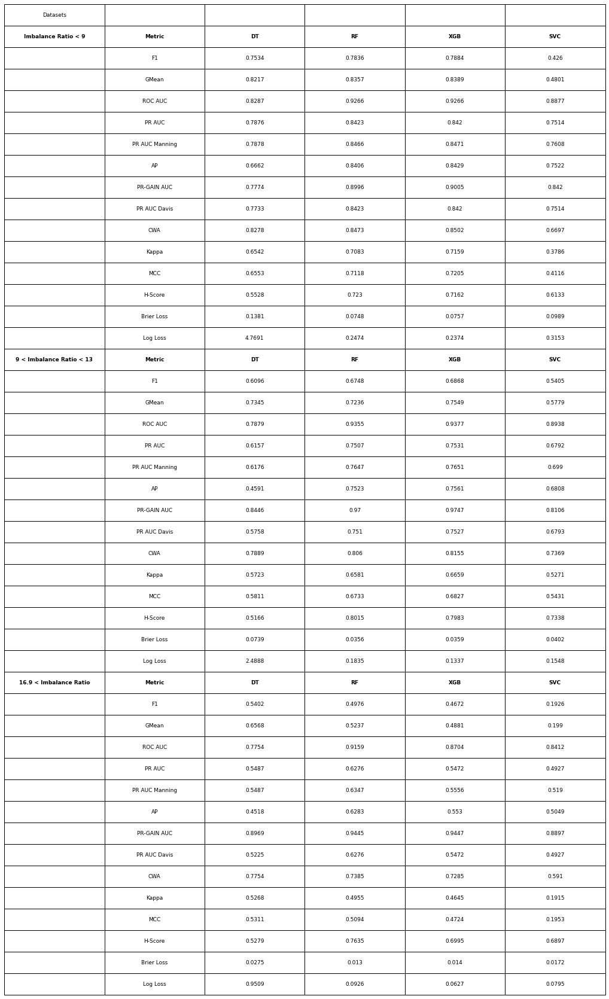

In [ ]:
#Printing the results
printScoresAvg(scores)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:177: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


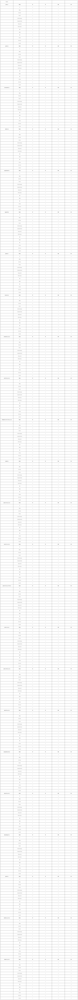

In [ ]:
#Printing the ranks of all metrics
ranks = rankScores(scores)
printRanks(ranks)

# Correlation

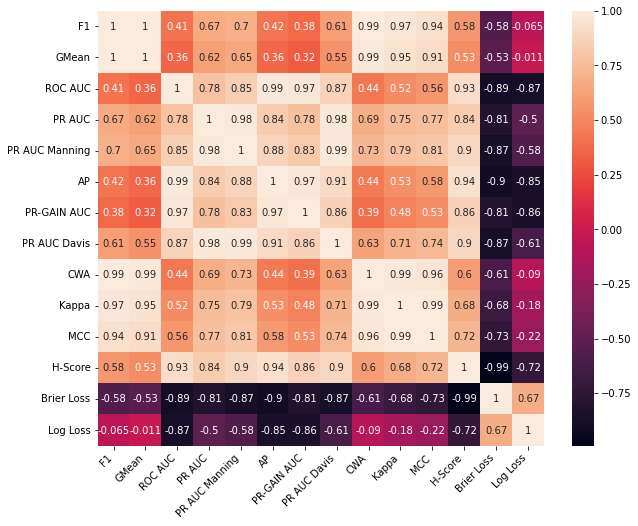

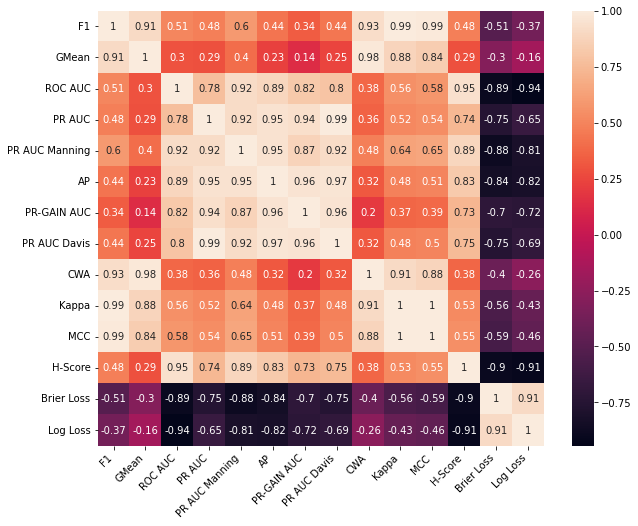

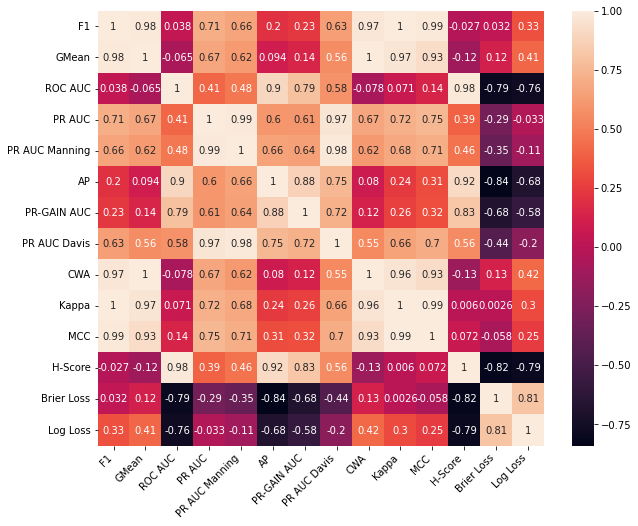

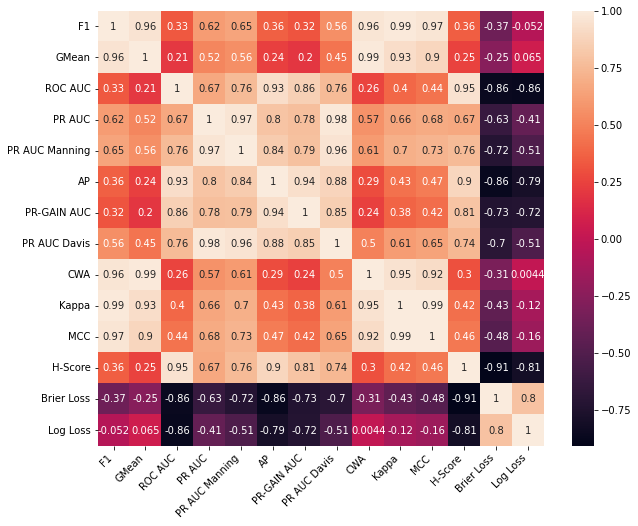

In [ ]:
printCorrelationMatrix(scores, 'pearson', False)

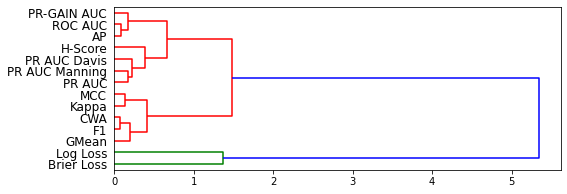

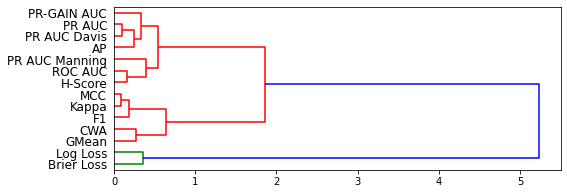

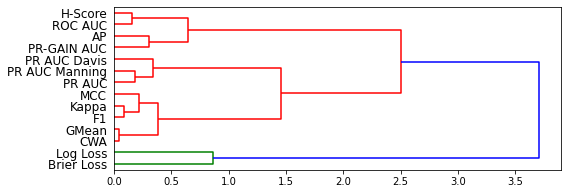

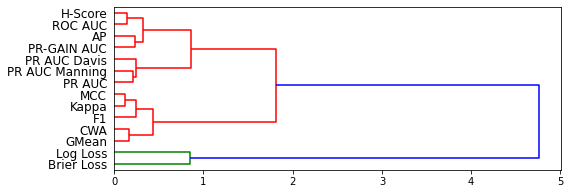

In [ ]:
printCorrelationMatrix(scores, 'pearson', True)

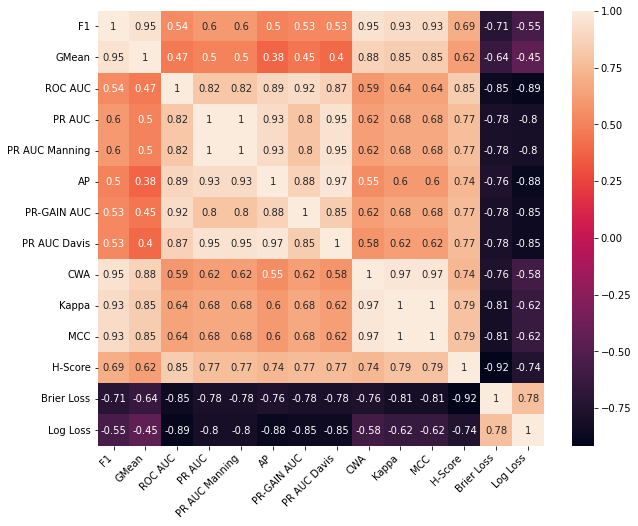

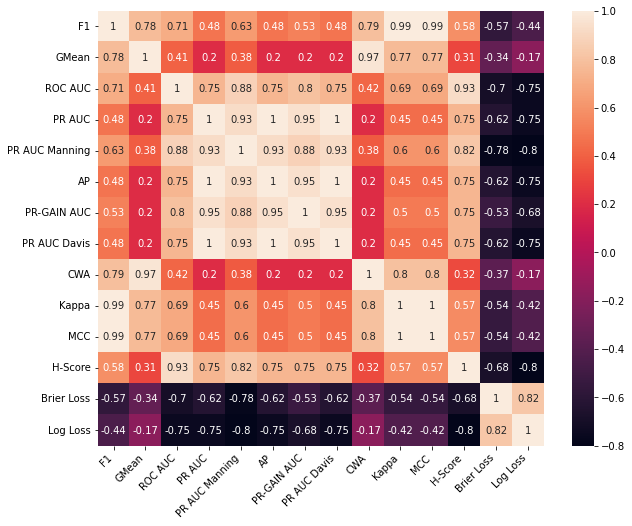

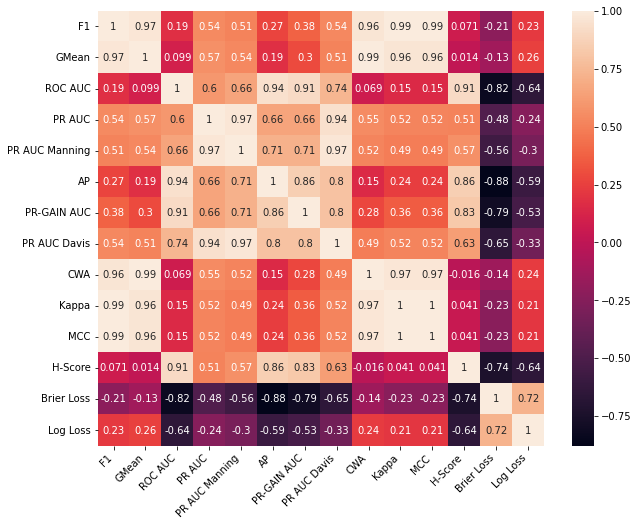

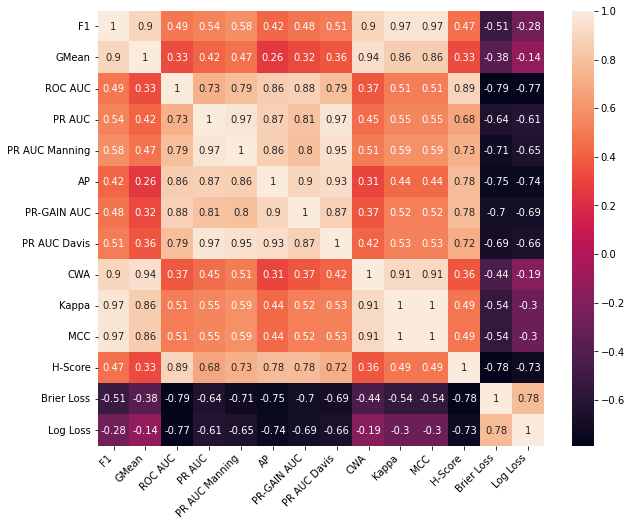

In [ ]:
printCorrelationMatrix(scores, 'spearman', False)

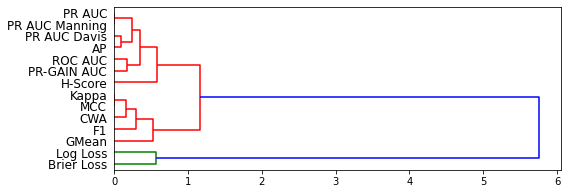

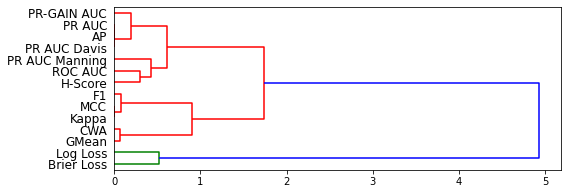

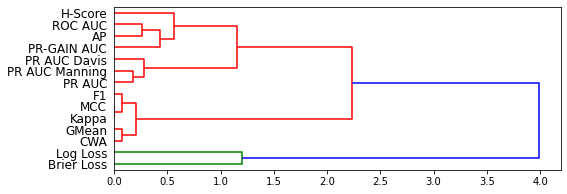

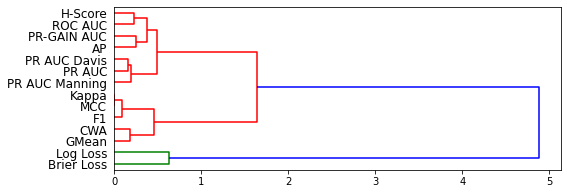

In [ ]:
printCorrelationMatrix(scores, 'spearman', True)

# Original Study

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:358: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


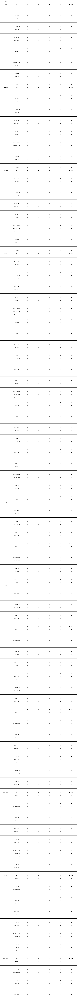

In [ ]:
#Printing the mode difference of all metrics
modes, new_metrics = printMode(ranks, allData=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:408: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


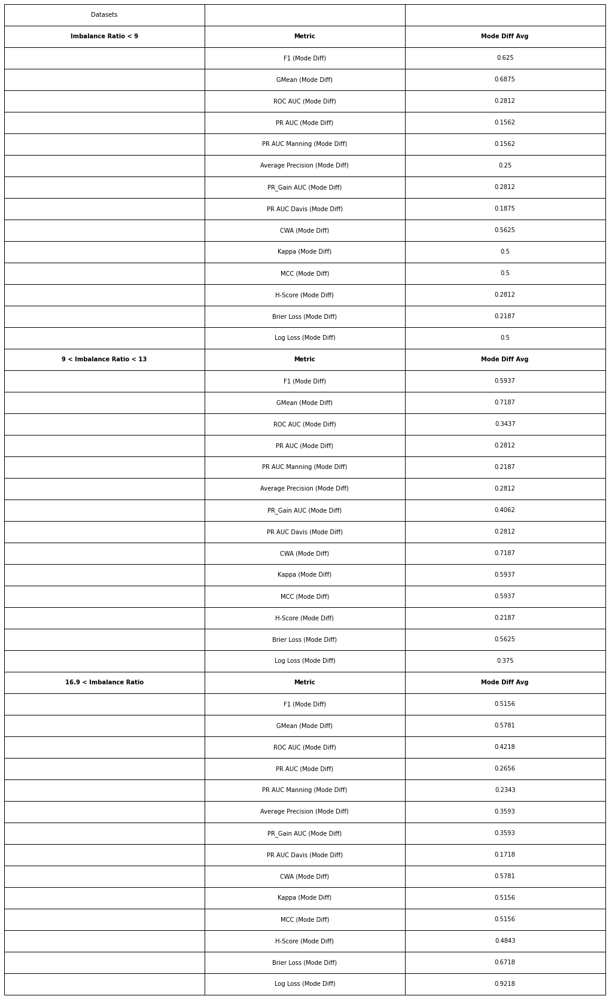

In [ ]:
#Averaging the mode difference over imbalance ratios
printModeAvg(modes,new_metrics)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:482: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


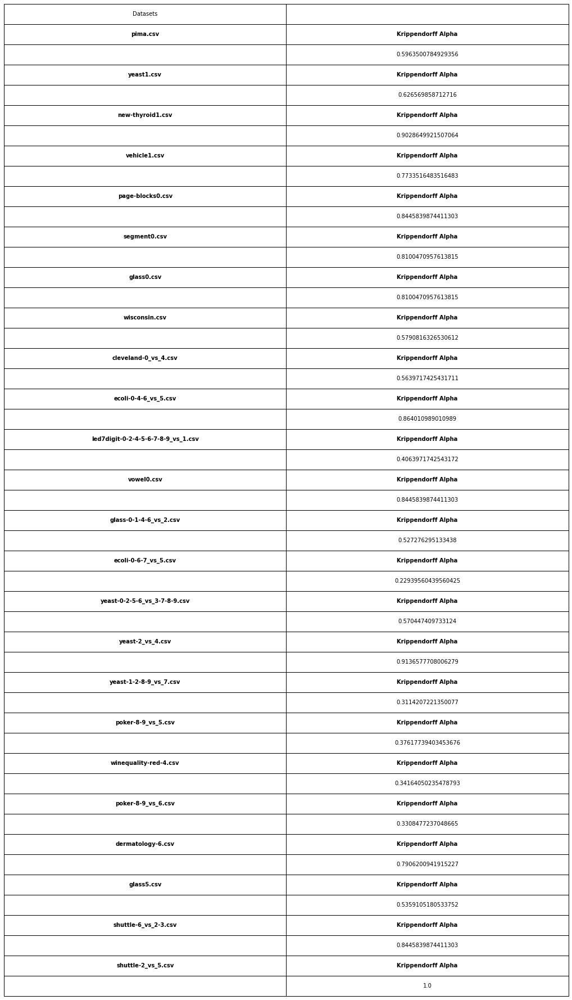

0.7428620486656201
0.6149676216640503
0.5664001177394034


In [ ]:
#Printing the Krippendorff's Alpha
printKrippendorff(ranks)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:358: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


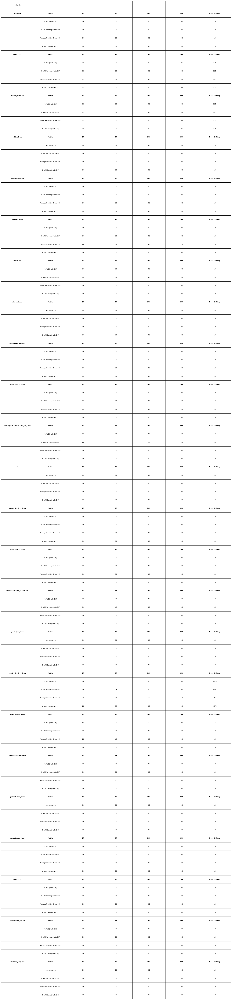

In [ ]:
#Computing and printing the mode difference over only the difference interpretations of the PR Curve
modes, new_metrics = printMode(ranks, allData=True, metrics=['PRAUC','PRAUCManning','PRAUCDavis','AP'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:408: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


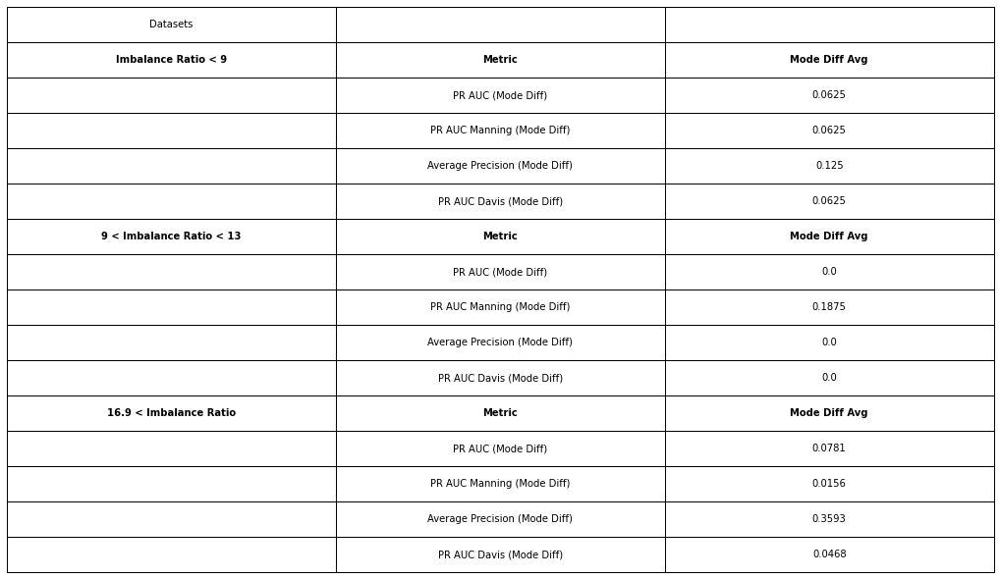

In [ ]:
#Averaging the mode difference over imbalance ratios
printModeAvg(modes,new_metrics)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:482: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


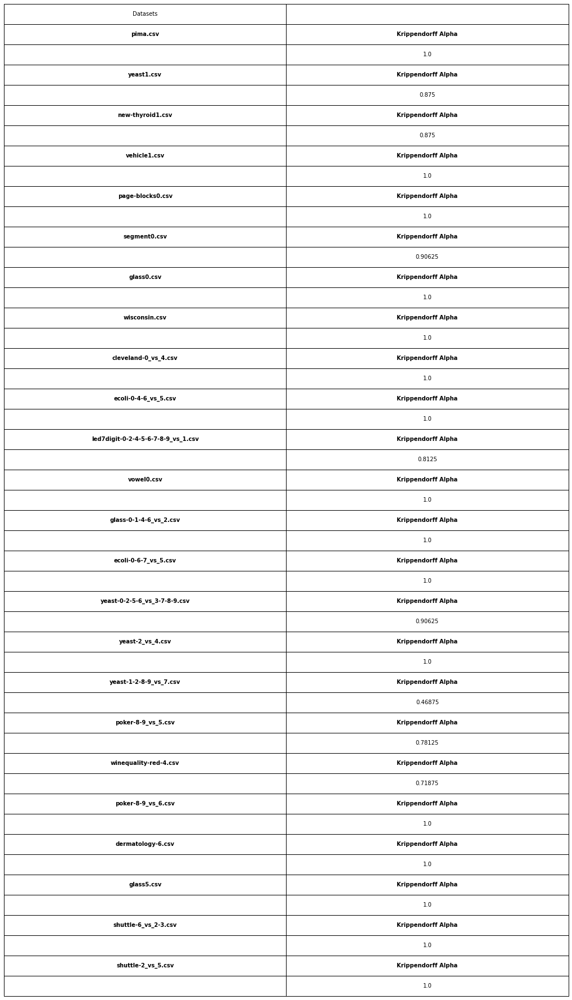

0.95703125
0.96484375
0.87109375


In [ ]:
#Printing the Krippendorff's Alphas
printKrippendorff(ranks, ['PRAUC','PRAUCManning','PRAUCDavis','AP'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:358: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


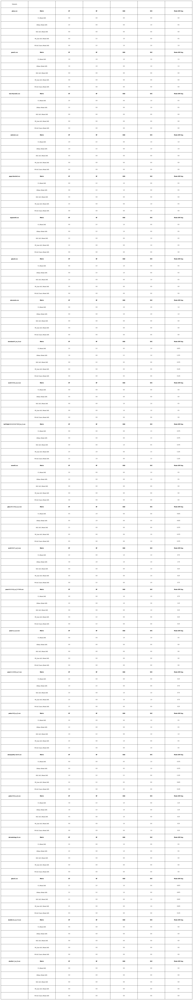

In [ ]:
#Computing and printing the mode difference over the best performing PR interpolation and other metrics
modes, new_metrics = printMode(ranks, allData=True, metrics=['F1','GMean','ROCAUC','PRAUCDavis','PRGAINAUC'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:408: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


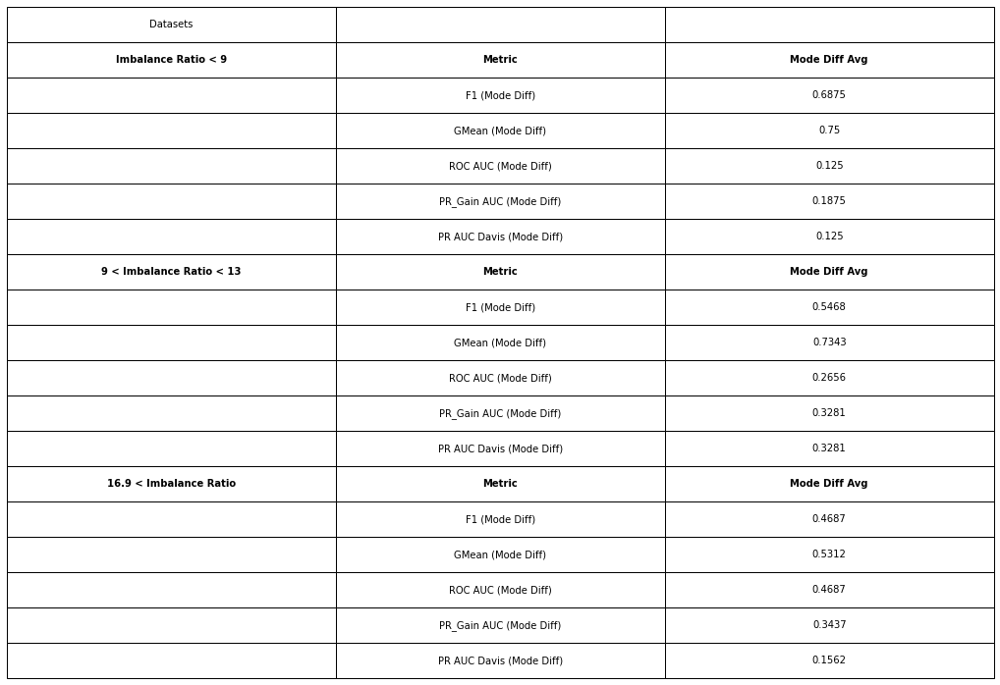

In [ ]:
#Averaging the mode differences over the imbalance ratios
printModeAvg(modes,new_metrics)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:482: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


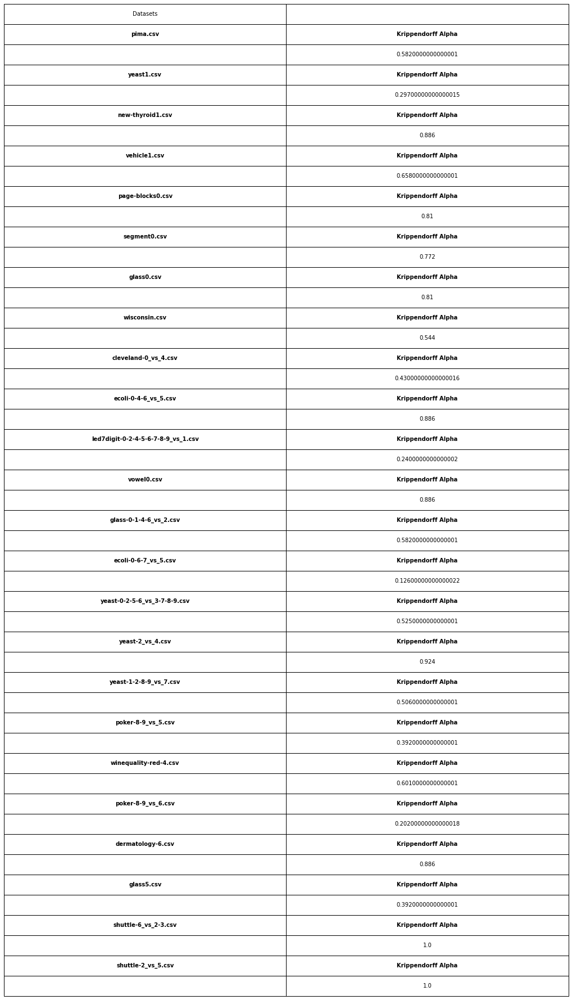

0.669875
0.5748750000000001
0.6223750000000001


In [ ]:
#Printing the Krippendorff's Alpha
printKrippendorff(ranks, ['F1','GMean','ROCAUC','PRAUCDavis','PRGAINAUC'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:358: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


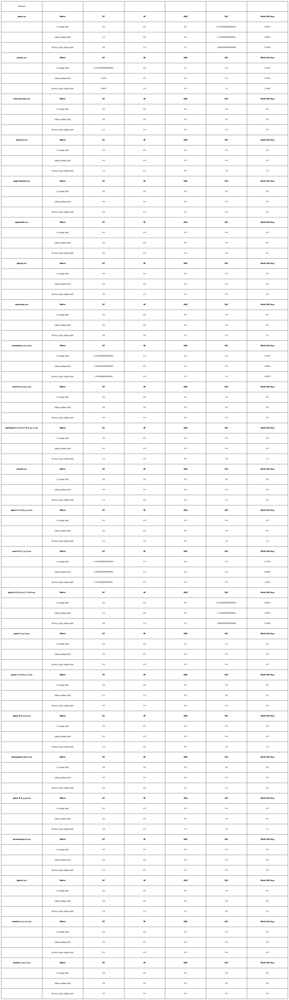

In [ ]:
#Computing and printing the mode difference over only F1, G-Mean and PR AUC Davis to test the disparity between ranked and threshold metrics
modes, new_metrics = printMode(ranks, allData=True, metrics=['F1','GMean','PRAUCDavis'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:408: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


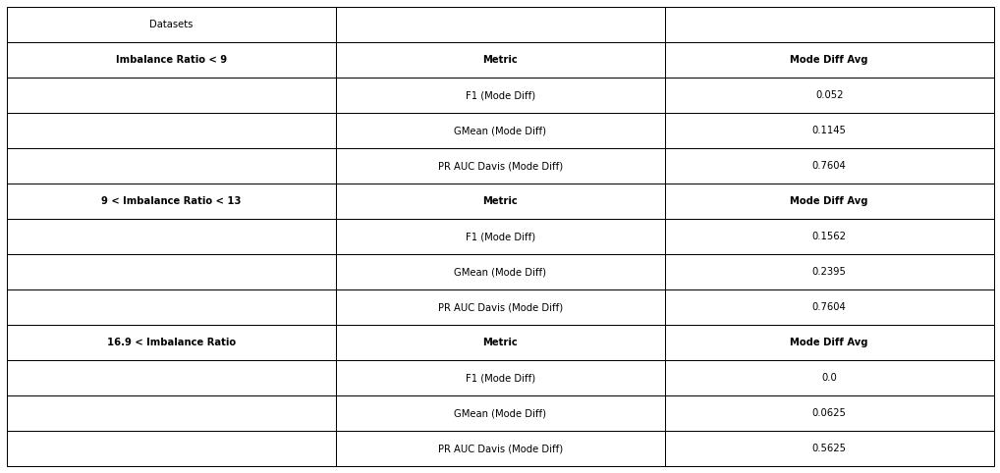

In [ ]:
#Averaging the mode differences over the imbalance ratios
printModeAvg(modes,new_metrics)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:358: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


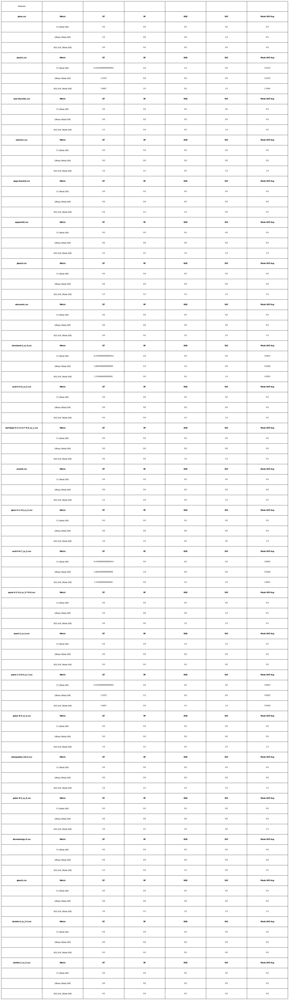

In [ ]:
#Computing and printing the mode difference over only F1, G-Mean and ROC AUC to test the disparity between ranked and threshold metrics
modes, new_metrics = printMode(ranks, allData=True, metrics=['F1','GMean','ROCAUC'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:408: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


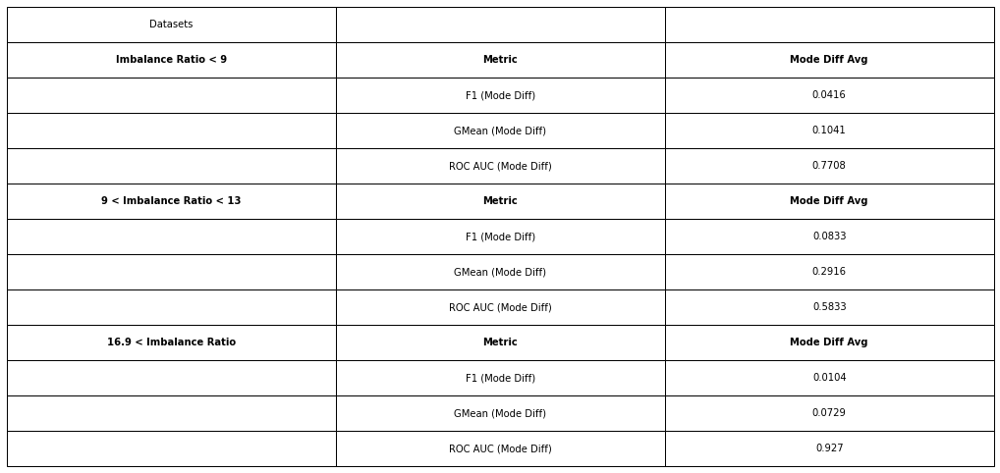

In [ ]:
#Averaging the mode differences over the imbalance ratios
printModeAvg(modes,new_metrics)

# Newly Added Comparisons

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:358: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


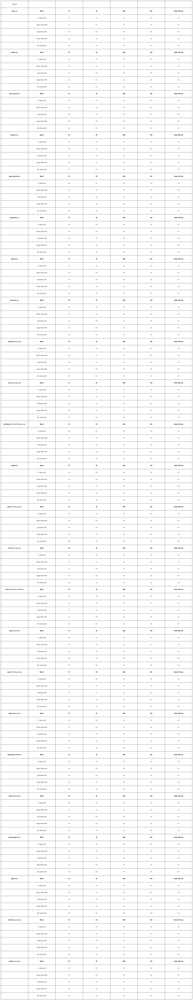

In [ ]:
#Computing and printing the mode difference over only threshold metrics
#['F1','GMean','ROCAUC','PRAUC','PRAUCManning','AP','PRGAINAUC','PRAUCDavis','CWA','Kappa','MCC','H-Score','BrierLoss','LogLoss']

modes, new_metrics = printMode(ranks, allData=True, metrics=['CWA','Kappa','MCC','F1','GMean'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:408: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


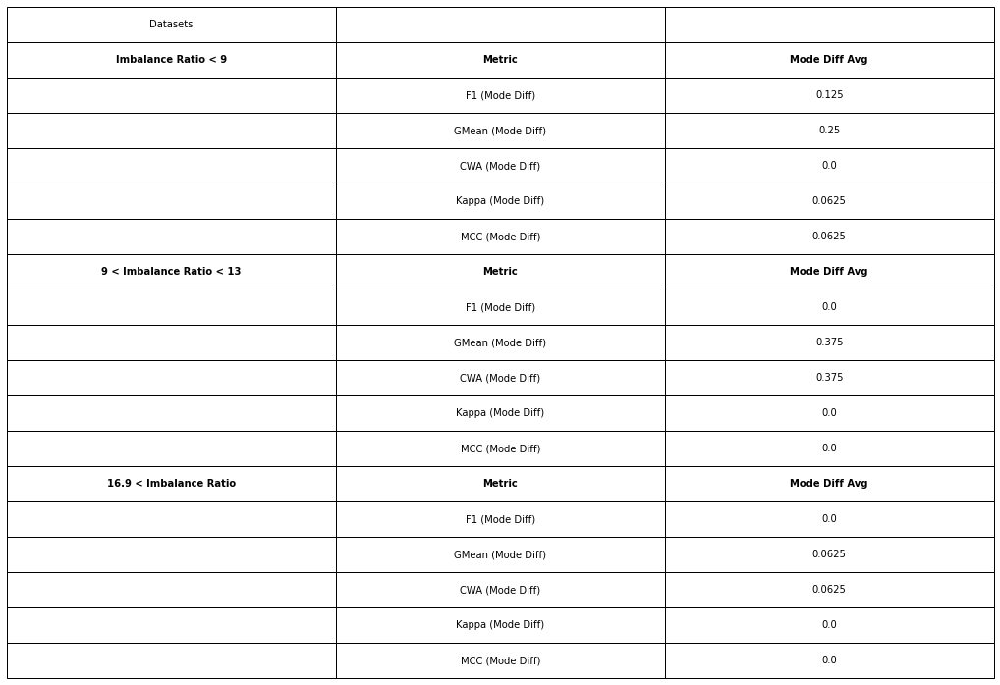

In [ ]:
#Averaging the mode differences over the imbalance ratios
printModeAvg(modes,new_metrics)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:482: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


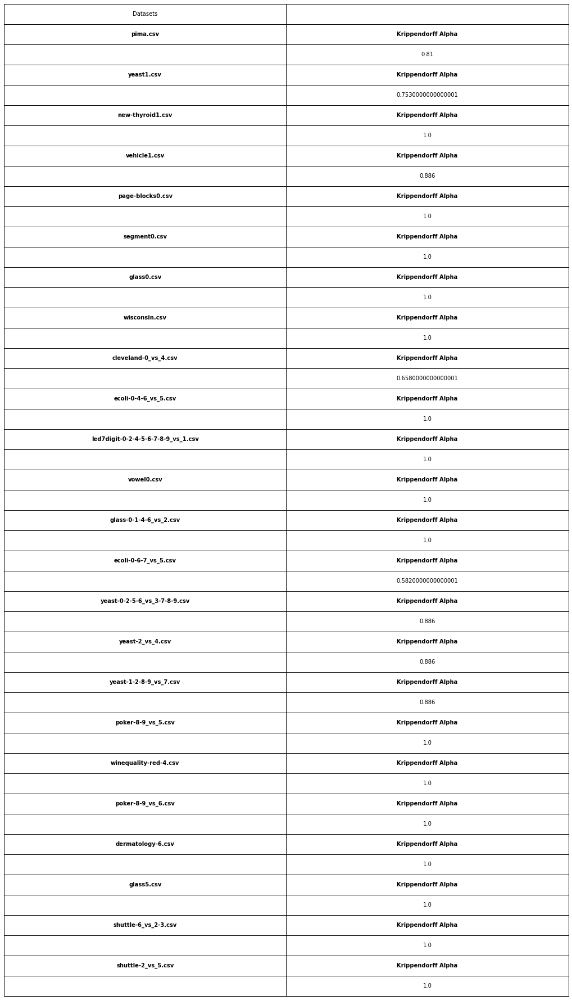

0.931125
0.8765000000000001
0.98575


In [ ]:
#Printing the Krippendorff's Alphas
printKrippendorff(ranks, ['CWA','Kappa','MCC','F1','GMean'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:358: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


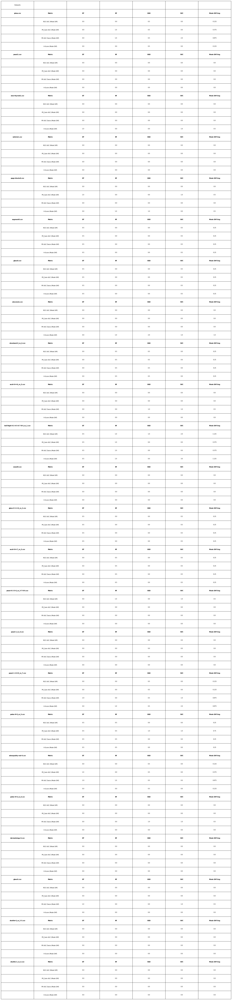

In [ ]:
#Computing and printing the mode difference over only ranking metrics
#['F1','GMean','ROCAUC','PRAUC','PRAUCManning','AP','PRGAINAUC','PRAUCDavis','CWA','Kappa','MCC','H-Score','BrierLoss','LogLoss']

modes, new_metrics = printMode(ranks, allData=True, metrics=['ROCAUC','PRGAINAUC','PRAUCDavis','H-Score'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:408: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


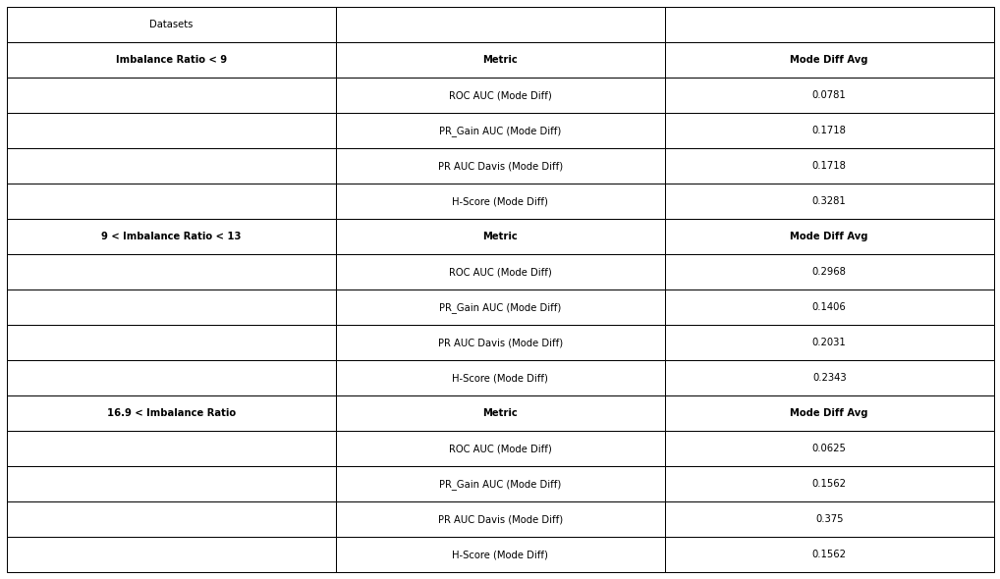

In [ ]:
#Averaging the mode differences over the imbalance ratios
printModeAvg(modes,new_metrics)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:482: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


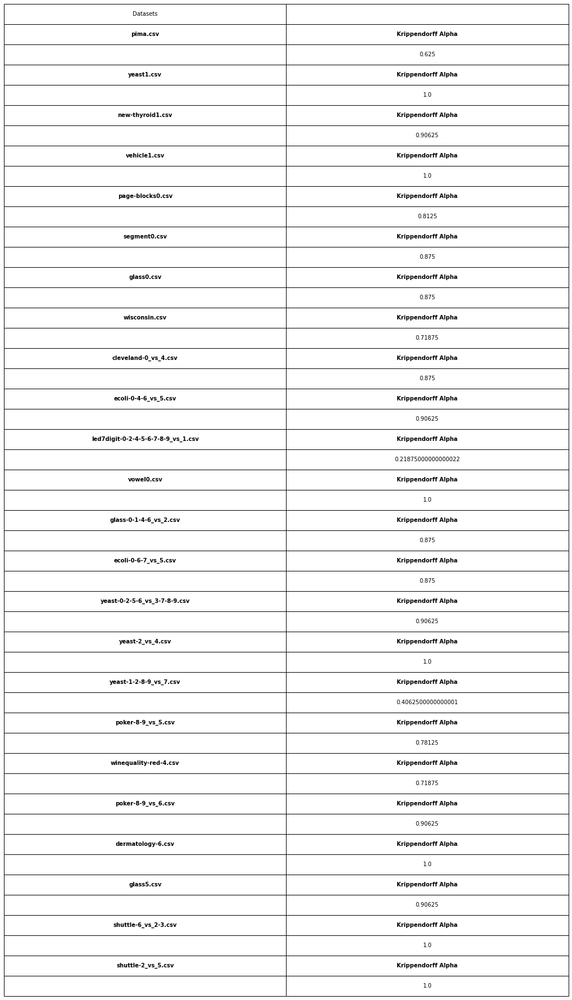

0.8515625
0.83203125
0.83984375


In [ ]:
#Printing the Krippendorff's Alphas
printKrippendorff(ranks, ['ROCAUC','PRGAINAUC','PRAUCDavis','H-Score'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:358: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


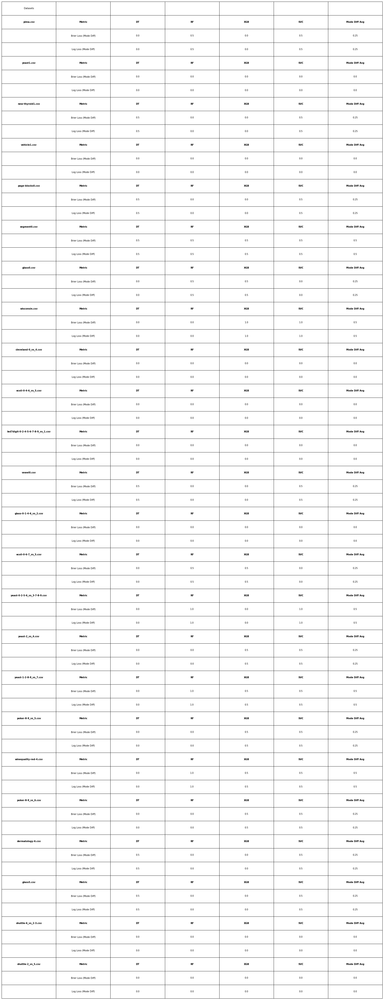

In [ ]:
#Computing and printing the mode difference over only probabilistic metrics
#['F1','GMean','ROCAUC','PRAUC','PRAUCManning','AP','PRGAINAUC','PRAUCDavis','CWA','Kappa','MCC','H-Score',]

modes, new_metrics = printMode(ranks, allData=True, metrics=['BrierLoss','LogLoss'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:408: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


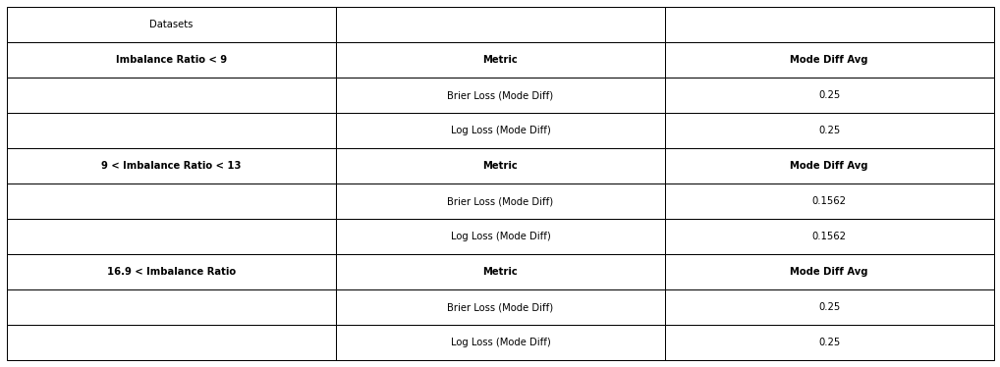

In [ ]:
#Averaging the mode differences over the imbalance ratios
printModeAvg(modes,new_metrics)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:482: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


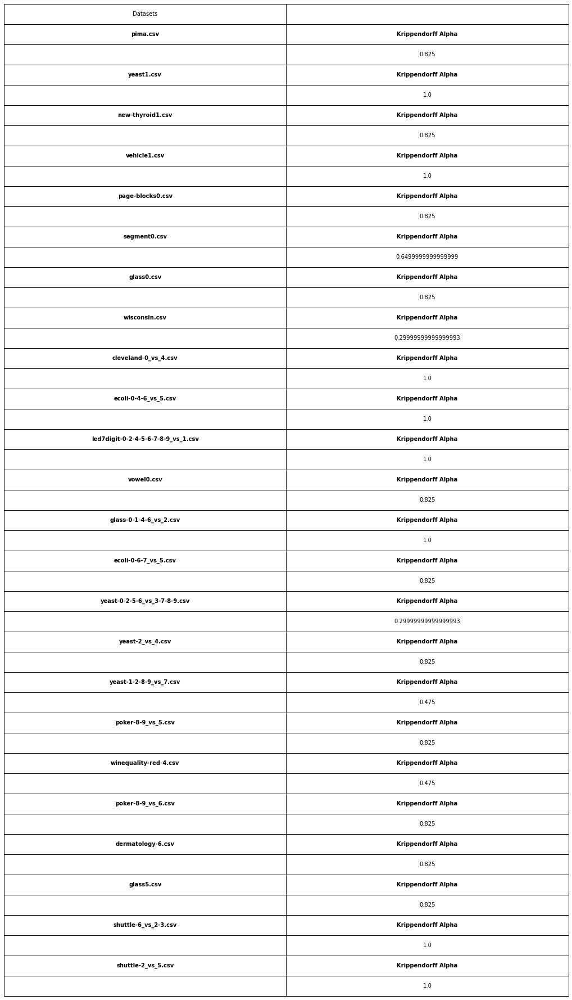

0.78125
0.846875
0.78125


In [ ]:
#Printing the Krippendorff's Alphas
printKrippendorff(ranks, ['BrierLoss','LogLoss'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:358: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


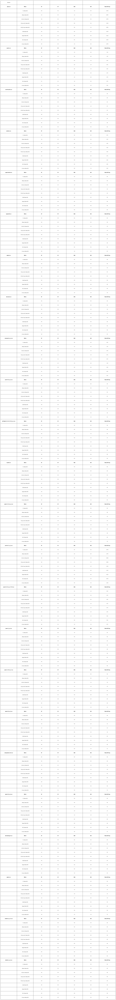

In [ ]:
#Computing and printing the mode difference over threshold metrics and ranking ones
#['F1','GMean','ROCAUC','PRAUC','PRAUCManning','AP','PRGAINAUC','PRAUCDavis','CWA','Kappa','MCC','H-Score','BrierLoss','LogLoss']

modes, new_metrics = printMode(ranks, allData=True, metrics=['F1','GMean','ROCAUC','PRGAINAUC','PRAUCDavis','CWA','Kappa','MCC','H-Score'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:408: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


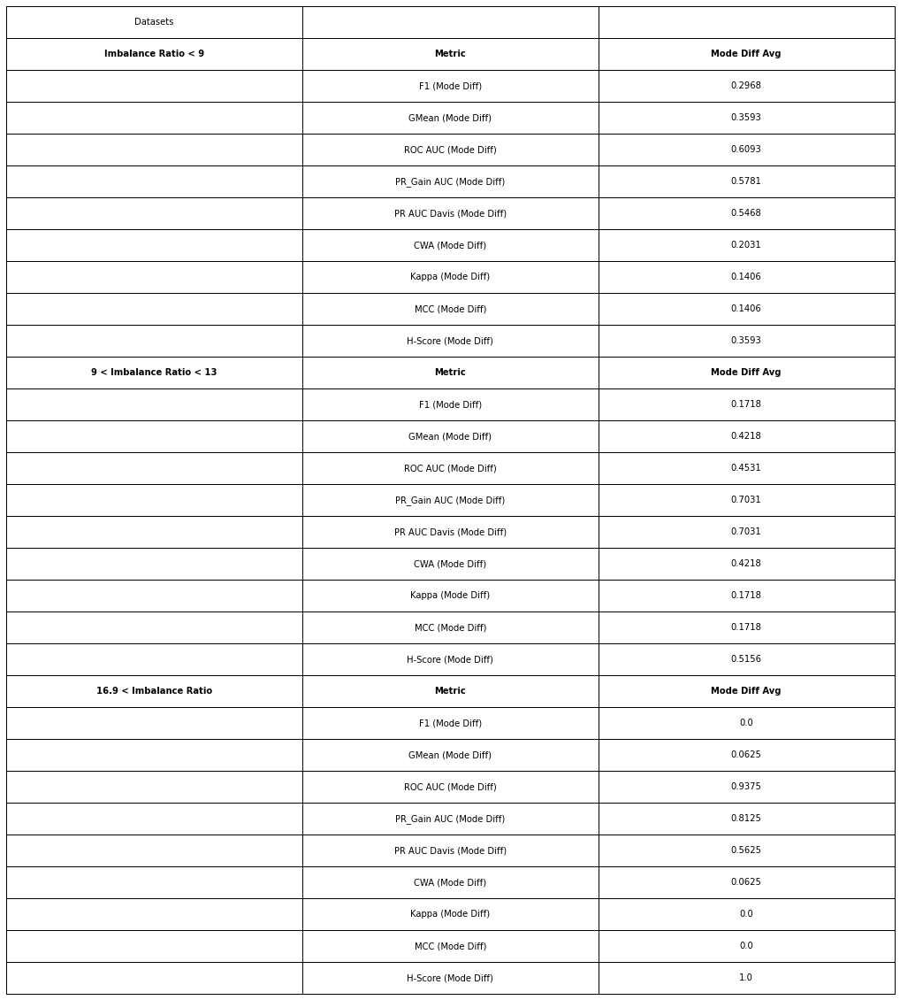

In [ ]:
#Averaging the mode differences over the imbalance ratios
printModeAvg(modes,new_metrics)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:482: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


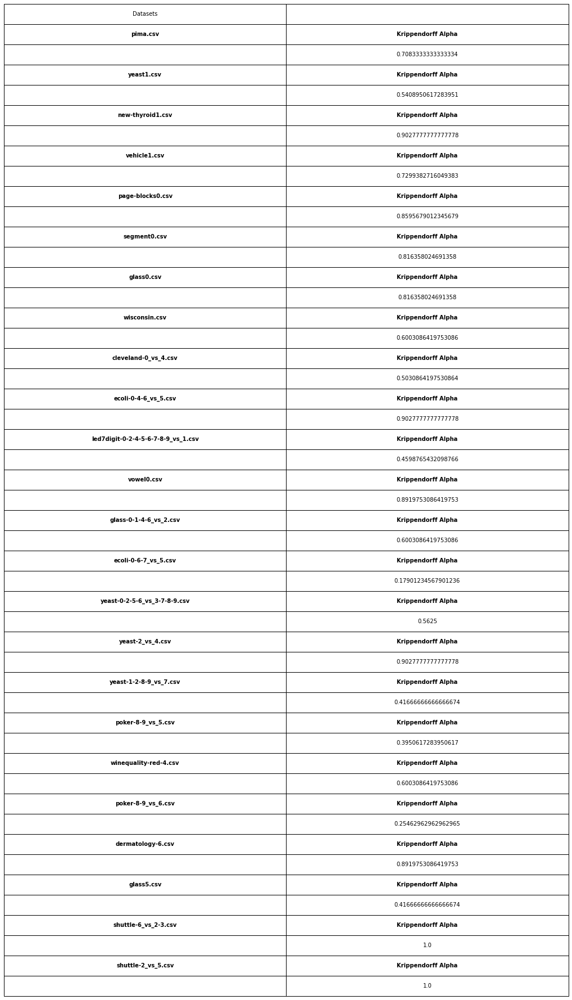

0.7468171296296297
0.6252893518518519
0.6219135802469136


In [ ]:
#Printing the Krippendorff's Alphas
printKrippendorff(ranks, ['F1','GMean','ROCAUC','PRGAINAUC','PRAUCDavis','CWA','Kappa','MCC','H-Score'])

# Noise

In [ ]:
#Functions definitions

def calc_score(pred_proba, pred, y_true):
  scores_synth = {}
  y_probabilities = pred_proba[:,1]

  precision, recall, _ = precision_recall_curve(y_true, y_probabilities)
  prg_curve = prg.create_prg_curve(y_true, y_probabilities)
  _, _, pr_auc_manning = pr_manning(precision, recall)
  _, _, pr_auc_davis = pr_davis(y_true, y_probabilities)

  scores_synth['F1'] = f1_score(y_true=y_true, y_pred=pred)
  scores_synth['gmeans'] = gmean_score(y_true=y_true, y_pred=pred)
  scores_synth['roc_auc'] = roc_auc_score(y_true=y_true, y_score=pred_proba[:,1], average=None)
  scores_synth['pr_auc'] = auc(recall, precision)
  scores_synth['pr_auc_manning'] = pr_auc_manning
  scores_synth['pr_auc_ap'] = average_precision_score(y_true, y_probabilities)
  scores_synth['prg_auc'] = prg.calc_auprg(prg_curve)
  scores_synth['pr_auc_davis'] = pr_auc_davis
  scores_synth['cwas'] = balanced_accuracy_score(y_true=y_true, y_pred=pred)
  scores_synth['kappas'] = cohen_kappa_score(y_true, pred, weights=None)
  scores_synth['mccs'] = matthews_corrcoef(y_true=y_true, y_pred=pred)
  scores_synth['hscores'] = hmeasure.h_score(y_true=np.asarray(y_true), y_score=pred_proba[:,1], severity_ratio=None)
  scores_synth['brier_losses_inv'] = brier_score_loss(y_true=y_true, y_prob=pred_proba[:,1]) ** -1
  scores_synth['log_losses_inv'] = log_loss(y_true=y_true, y_pred=pred_proba[:,1]) ** -1

  return scores_synth

def randomize(pred_proba, pred, y_true, randomize_ratio):
  rng = np.random.default_rng()
  rints = rng.choice(len(pred), size=len(pred), replace=False)
  
  new_pred_proba = copy.deepcopy(pred_proba)
  new_pred = copy.deepcopy(pred)

  counter = 0
  i = 0
  while (counter < int(round(len(pred)*randomize_ratio))) and (i < len(pred)): 
    if pred[rints[i]] == y_true[rints[i]]:
      counter+=1
      rng = np.random.default_rng()
      rint = rng.uniform(low=0.0, high=0.5) if pred[rints[i]] == 0 else rng.uniform(low=0.51, high=1.0)
      new_pred_proba[rints[i]][0] = rint 
      new_pred_proba[rints[i]][1] = 1-rint
      new_pred[rints[i]] = 0 if rint > 0.5 else 1

    i+=1

  return new_pred_proba, new_pred

def create_classification(n_samples, random_state=None, class_sep=1.0, n_clusters_per_class=2, weights=None, n_features=20, n_informative=2):
  X_synth, y_synth = datasets.make_classification(n_samples=n_samples, random_state=random_state, class_sep=class_sep, n_features=n_features, n_clusters_per_class=n_clusters_per_class, weights=weights, flip_y=0.0, n_informative=n_informative)
  #X_train_synth, X_test_synth, y_train_synth, y_test_synth = train_test_split(X_synth, y_synth, test_size=0.25, random_state=42, stratify=y_synth)

  #pred_proba = classifier.predict_proba(X_test_synth)
  #pred = classifier.predict(X_test_synth)
  pred_proba = []
  pred = []

  for i in y_synth:
    pred.append(i)
    rng = np.random.default_rng()
    rint = rng.uniform(low=0.0, high=0.5) if i == 1 else rng.uniform(low=0.51, high=1.0)
    pred_proba.append([rint, 1-rint])

  pred_proba = np.array(pred_proba)
  pred = np.array(pred)
  
  rng = np.random.default_rng()
  rints = rng.choice(len(pred), size=int(0.10*len(pred)), replace=False)

  for i in rints:
    rng = np.random.default_rng()
    rint = rng.uniform(low=0.0, high=1)
    pred_proba[i][0] = rint 
    pred_proba[i][1] = 1-rint

    pred[i] = 0 if rint > 0.5 else 1


  return pred_proba, pred, y_synth

def calc_effect(scores_c1, scores_c2):
  #Creating empty dict with the correct keys
  effect = dict((el,0) for el in scores_c1[0].keys())

  for i in range(len(scores_c1)):
    for key in effect.keys():
      effect[key] += 1/len(scores_c1) if scores_c1[i][key] < scores_c2[i][key] else 0.5/len(scores_c1) if scores_c1[i][key] == scores_c2[i][key] else 0
  return effect

def calc_noise_effect(noise_scores_c1, noise_scores_c2):
  noise_scores_c1 = np.transpose(noise_scores_c1)
  noise_scores_c2 = np.transpose(noise_scores_c2)
  noise_effect = dict((el,[]) for el in noise_scores_c1[0][0].keys()) #Creating empty dict with all the necessary keys for each performance metrics

  for i in range(len(noise_scores_c1)):
    effect = calc_effect(noise_scores_c1[i], noise_scores_c2[i])
    for key in effect.keys():
      noise_effect[key].append(effect[key])

  return noise_effect

def misclassification_noise(y_true, ratio):
  new_y_true = copy.deepcopy(y_true)
  rng = np.random.default_rng()

  rints = rng.choice(len(y_true), size=int(round(len(y_true)*ratio)), replace=False)

  for num in rints:
    new_y_true[num] = 0 if new_y_true[num] == 1 else 1

  return new_y_true

def misclassification_noise_random(y_true, ratio):
  new_y_true = copy.deepcopy(y_true)
  rng = np.random.default_rng()

  rints = rng.choice(len(y_true), size=int(round(len(y_true)*ratio)), replace=False)

  for num in rints:
    new_y_true[num] = 0 if rng.uniform() < 0.5 else 1

  return new_y_true

def probability_noise(pred_proba, pred, alpha):
  new_pred_proba = copy.deepcopy(pred_proba)
  new_pred = copy.deepcopy(pred)

  for i in range(len(new_pred_proba)):
    if new_pred_proba[i][0]+alpha > 1:
      new_pred_proba[i][0] = 1
    elif new_pred_proba[i][0]+alpha < 0:
      new_pred_proba[i][0] = 0
    else:
      new_pred_proba[i][0] = new_pred_proba[i][0]+alpha
    
    new_pred_proba[i][1] = 1-new_pred_proba[i][0]
    new_pred[i] = 0 if new_pred_proba[i][0] > 0.5 else 1

  return new_pred_proba, new_pred

def print_effect_graph(effect_dict, keys):

  cm = plt.get_cmap('nipy_spectral')
  colors = [cm(i) for i in np.linspace(0, 1, len(keys))]
  
  plt.figure(figsize=(20, 10), dpi=150.0)

  for key, color in zip(keys, colors):
    plt.plot(np.linspace(0,1,len(effect_dict[key])), effect_dict[key], label=key, color=color)

  plt.xlabel('Noise Percentage', fontsize=18)
  plt.xticks(fontsize=16)

  plt.ylabel('Misclassification Rate',fontsize=18)
  plt.yticks(fontsize=16)

  plt.legend(fontsize=18)

  plt.show()


In [ ]:
#TESTING
pred_proba_c1, pred_c1, y_test = create_classification(n_samples=40, random_state=None, class_sep=1.0, n_clusters_per_class=2, weights=[0.95])
pred_proba_c2, pred_c2 = randomize(pred_proba_c1, pred_c1, y_test, 0.1)

unique, counts = np.unique(y_test, return_counts=True)

print(dict(zip(unique, counts)))

print(pred_proba_c1)
print(pred_c1)
print(y_test)

pred_proba_noise, pred_noise = probability_noise(pred_proba_c1, pred_c1, 0.3)

print(pred_proba_noise)
print(pred_noise)

{0: 38, 1: 2}
[[0.6548971  0.3451029 ]
 [0.73391656 0.26608344]
 [0.91085049 0.08914951]
 [0.87229796 0.12770204]
 [0.82904883 0.17095117]
 [0.56762595 0.43237405]
 [0.99004038 0.00995962]
 [0.89983049 0.10016951]
 [0.07507594 0.92492406]
 [0.71101649 0.28898351]
 [0.68736082 0.31263918]
 [0.93015783 0.06984217]
 [0.72422493 0.27577507]
 [0.91213413 0.08786587]
 [0.59307405 0.40692595]
 [0.85542097 0.14457903]
 [0.84373442 0.15626558]
 [0.2989487  0.7010513 ]
 [0.94073172 0.05926828]
 [0.5628094  0.4371906 ]
 [0.60405099 0.39594901]
 [0.8260224  0.1739776 ]
 [0.87347207 0.12652793]
 [0.97456569 0.02543431]
 [0.91449813 0.08550187]
 [0.53080914 0.46919086]
 [0.73368005 0.26631995]
 [0.53375356 0.46624644]
 [0.54684193 0.45315807]
 [0.53510795 0.46489205]
 [0.76571704 0.23428296]
 [0.63290415 0.36709585]
 [0.71962668 0.28037332]
 [0.66557087 0.33442913]
 [0.69139556 0.30860444]
 [0.33691216 0.66308784]
 [0.79678115 0.20321885]
 [0.94263723 0.05736277]
 [0.91658297 0.08341703]
 [0.2099722

In [ ]:
#1 -- Misclassification Noise

# Slightly imbalanced: IR = 4.5

scores_c1 = []
scores_c2 = []

misclassified_scores_c1 = []
misclassified_scores_c2 = []

for i in range(100):
  pred_proba_c1, pred_c1, y_test = create_classification(n_samples=1000, random_state=None, class_sep=1.0, n_clusters_per_class=2, weights=[9/11])
  pred_proba_c2, pred_c2 = randomize(pred_proba_c1, pred_c1, y_test, 0.1)

  #Baseline
  scores_c1.append(calc_score(pred_proba_c1, pred_c1, y_test))
  scores_c2.append(calc_score(pred_proba_c2, pred_c2, y_test))

  #Misclassification noise
  temp_c1 = []
  temp_c2 = []
  for j in np.linspace(0,1,101):
    misclassified_y_test = misclassification_noise_random(y_test, j)
    temp_c1.append(calc_score(pred_proba_c1, pred_c1, misclassified_y_test))
    temp_c2.append(calc_score(pred_proba_c2, pred_c2, misclassified_y_test))

  misclassified_scores_c1.append(temp_c1)
  misclassified_scores_c2.append(temp_c2)

print(calc_effect(scores_c1, scores_c2))

#Calculating misclassification noise
misclassification_effect = calc_noise_effect(misclassified_scores_c1, misclassified_scores_c2)

print(misclassification_effect)

{'F1': 0, 'gmeans': 0, 'roc_auc': 0, 'pr_auc': 0, 'pr_auc_manning': 0, 'pr_auc_ap': 0, 'prg_auc': 0, 'pr_auc_davis': 0, 'cwas': 0, 'kappas': 0, 'mccs': 0, 'hscores': 0, 'brier_losses_inv': 0, 'log_losses_inv': 0}
{'F1': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.02, 0.01, 0.01, 0, 0, 0.03, 0.02, 0.05, 0.09, 0.060000000000000005, 0.15, 0.12999999999999998, 0.17, 0.20000000000000004, 0.2900000000000001, 0.26000000000000006, 0.25000000000000006, 0.3000000000000001, 0.46000000000000024, 0.5100000000000002, 0.46000000000000024, 0.5600000000000003, 0.6000000000000003, 0.7000000000000004, 0.6800000000000004, 0.6500000000000004, 0.8000000000000005, 0.7800000000000005, 0.7800000000000005, 0.8100000000000005, 0.8600000000000005, 0.8700000000000006, 0.9300000000000006, 0.9550000000000006, 0.9200000000000006, 0.9400000000000006, 0.9800000000000006, 0.9200000000000006, 0.9900000000000007, 0.9900000000000007,

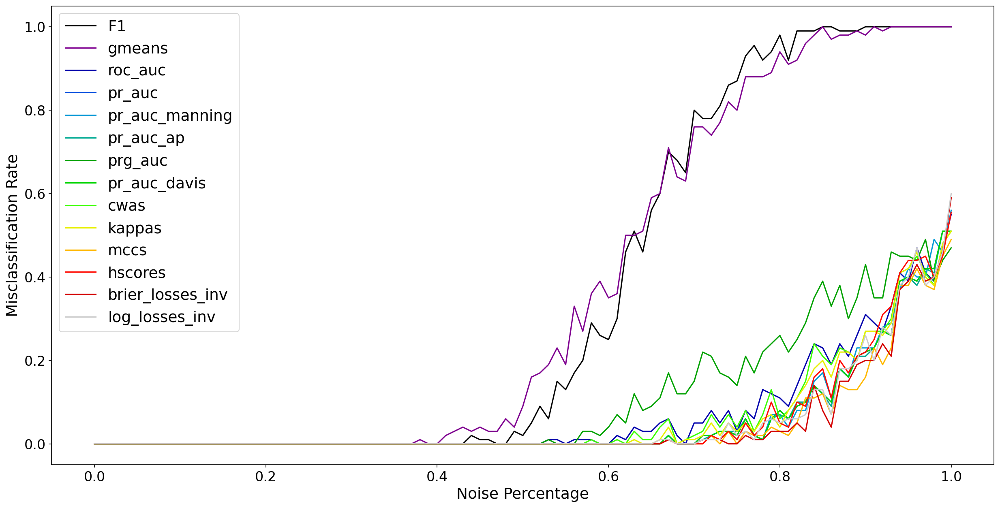

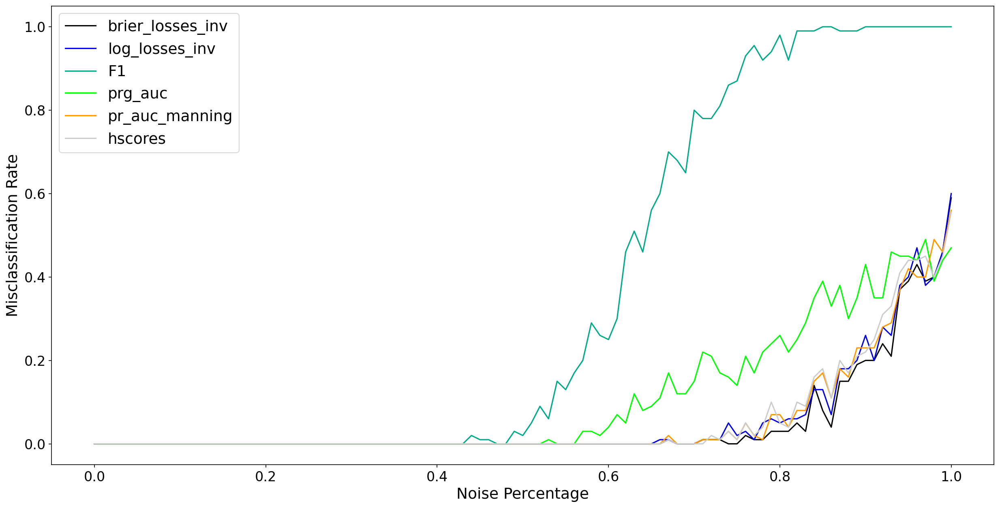

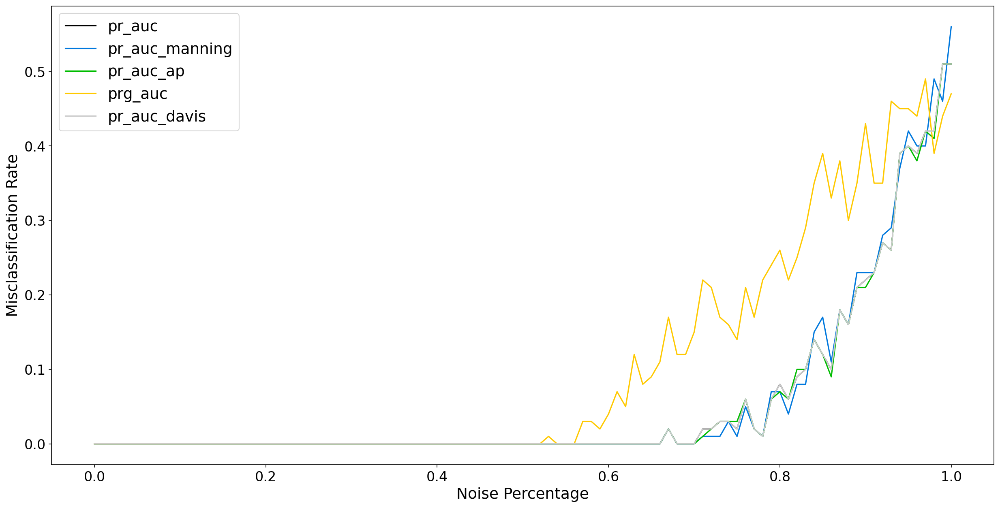

In [ ]:
#Creating graph for misclassification noise
print_effect_graph(misclassification_effect, misclassification_effect.keys())
print_effect_graph(misclassification_effect, ['brier_losses_inv', 'log_losses_inv', 'F1', 'prg_auc', 'pr_auc_manning', 'hscores'])
print_effect_graph(misclassification_effect, ['pr_auc', 'pr_auc_manning', 'pr_auc_ap', 'prg_auc', 'pr_auc_davis'])

{'F1': 0, 'gmeans': 0, 'roc_auc': 0, 'pr_auc': 0, 'pr_auc_manning': 0, 'pr_auc_ap': 0, 'prg_auc': 0, 'pr_auc_davis': 0, 'cwas': 0, 'kappas': 0, 'mccs': 0, 'hscores': 0, 'brier_losses_inv': 0, 'log_losses_inv': 0}
{'F1': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.01, 0, 0.01, 0.01, 0.03, 0.05, 0.07, 0.07, 0.060000000000000005, 0.16, 0.16, 0.20000000000000004, 0.26000000000000006, 0.37000000000000016, 0.3900000000000002, 0.47000000000000025, 0.4400000000000002, 0.6000000000000003, 0.5900000000000003, 0.6200000000000003, 0.7600000000000005, 0.7400000000000004, 0.8200000000000005, 0.7900000000000005, 0.8500000000000005, 0.8700000000000006, 0.9200000000000006, 0.9400000000000006, 0.9500000000000006, 0.9800000000000006, 0.9600000000000006, 0.9500000000000006, 0.9900000000000007, 0.9900000000000007, 0.9800000000000006, 0.9700000000000006, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 0.9900

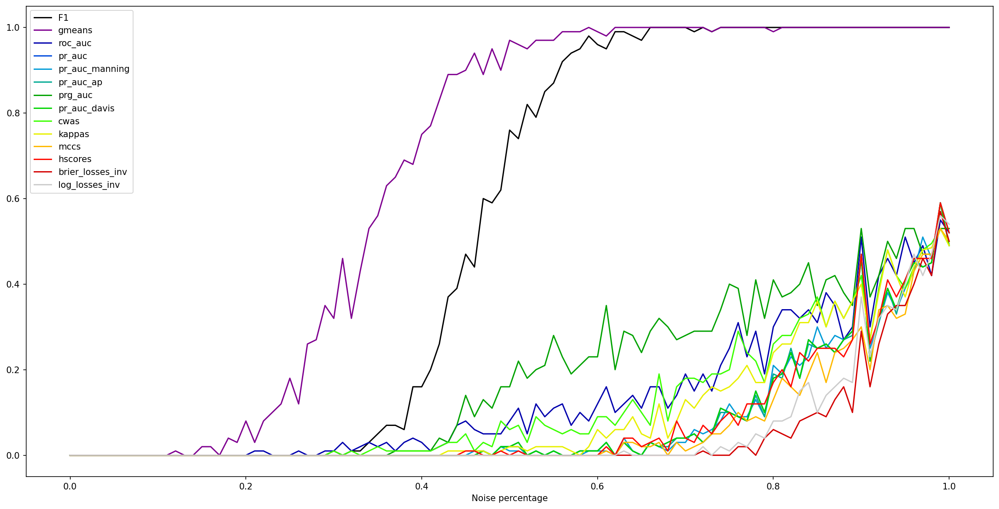

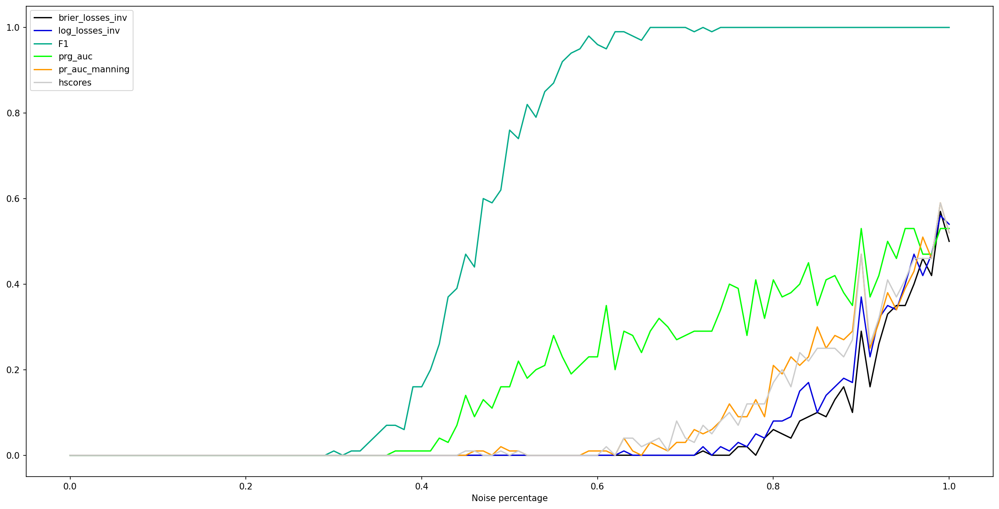

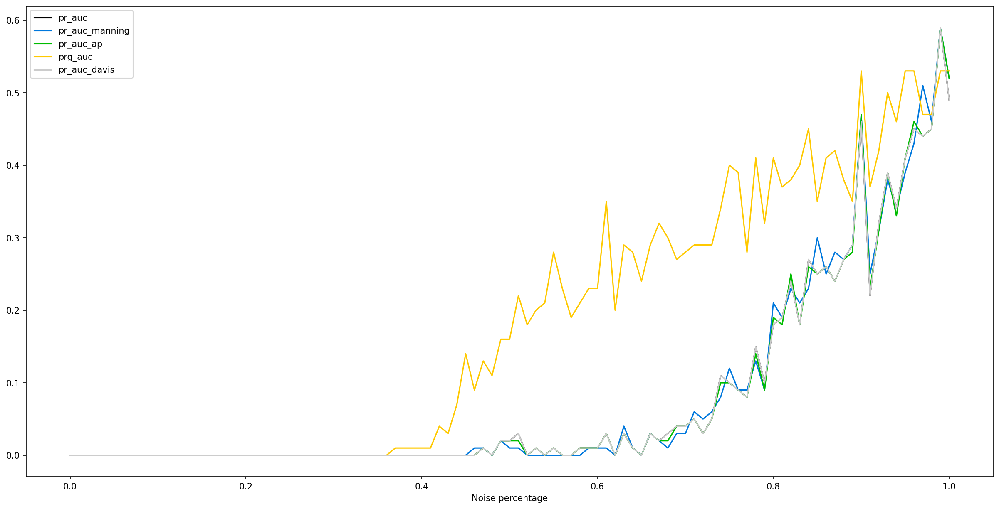

In [ ]:
#1 -- Misclassification Noise

# Moderately imbalanced: IR = 11

scores_c1 = []
scores_c2 = []

misclassified_scores_c1 = []
misclassified_scores_c2 = []

for i in range(100):
  pred_proba_c1, pred_c1, y_test = create_classification(n_samples=1000, random_state=None, class_sep=1.0, n_clusters_per_class=2, weights=[11/12])
  pred_proba_c2, pred_c2 = randomize(pred_proba_c1, pred_c1, y_test, 0.1)

  #Baseline
  scores_c1.append(calc_score(pred_proba_c1, pred_c1, y_test))
  scores_c2.append(calc_score(pred_proba_c2, pred_c2, y_test))

  #Misclassification noise
  temp_c1 = []
  temp_c2 = []
  for j in np.linspace(0,1,101):
    misclassified_y_test = misclassification_noise_random(y_test, j)
    temp_c1.append(calc_score(pred_proba_c1, pred_c1, misclassified_y_test))
    temp_c2.append(calc_score(pred_proba_c2, pred_c2, misclassified_y_test))

  misclassified_scores_c1.append(temp_c1)
  misclassified_scores_c2.append(temp_c2)

print(calc_effect(scores_c1, scores_c2))

#Calculating misclassification noise
misclassification_effect = calc_noise_effect(misclassified_scores_c1, misclassified_scores_c2)

print(misclassification_effect)

#Creating graph for misclassification noise
print_effect_graph(misclassification_effect, misclassification_effect.keys())
print_effect_graph(misclassification_effect, ['brier_losses_inv', 'log_losses_inv', 'F1', 'prg_auc', 'pr_auc_manning', 'hscores'])
print_effect_graph(misclassification_effect, ['pr_auc', 'pr_auc_manning', 'pr_auc_ap', 'prg_auc', 'pr_auc_davis'])

{'F1': 0, 'gmeans': 0, 'roc_auc': 0, 'pr_auc': 0, 'pr_auc_manning': 0, 'pr_auc_ap': 0, 'prg_auc': 0, 'pr_auc_davis': 0, 'cwas': 0, 'kappas': 0, 'mccs': 0, 'hscores': 0, 'brier_losses_inv': 0, 'log_losses_inv': 0}
{'F1': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.01, 0.01, 0.04, 0.10999999999999999, 0.07, 0.12999999999999998, 0.11999999999999998, 0.2800000000000001, 0.24000000000000007, 0.3900000000000002, 0.48000000000000026, 0.48000000000000026, 0.6600000000000004, 0.6500000000000004, 0.6600000000000004, 0.7100000000000004, 0.7900000000000005, 0.8000000000000005, 0.8800000000000006, 0.9000000000000006, 0.9400000000000006, 0.9800000000000006, 0.9300000000000006, 0.9600000000000006, 1.0000000000000007, 1.0000000000000007, 0.9800000000000006, 0.9700000000000006, 0.9800000000000006, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007

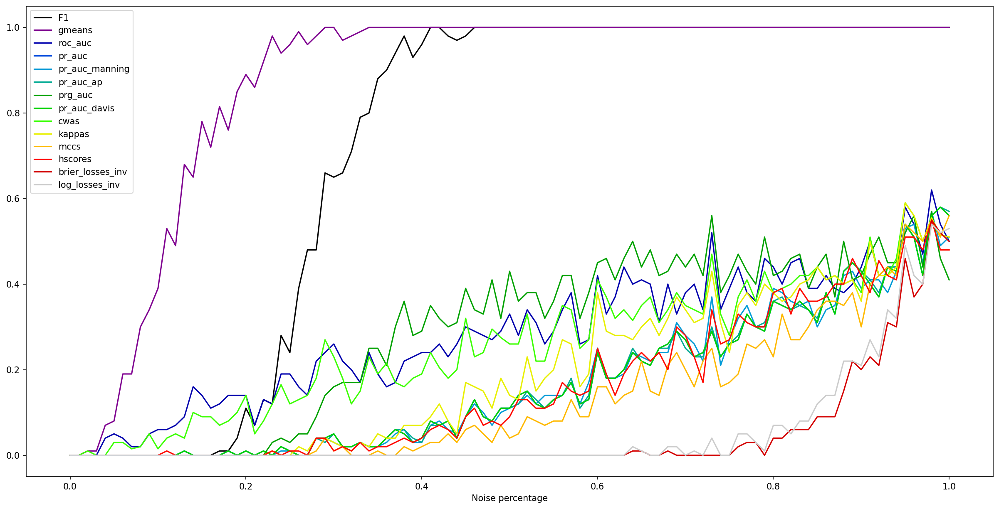

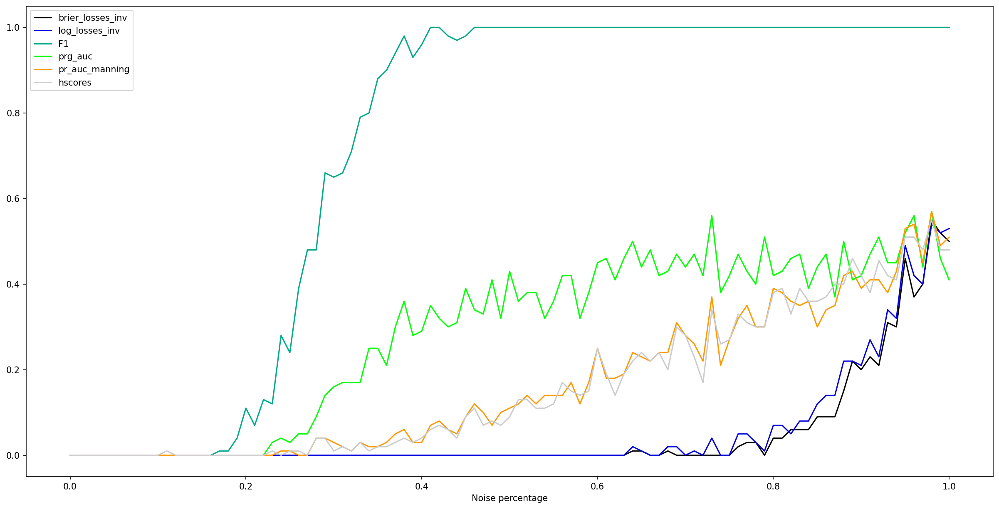

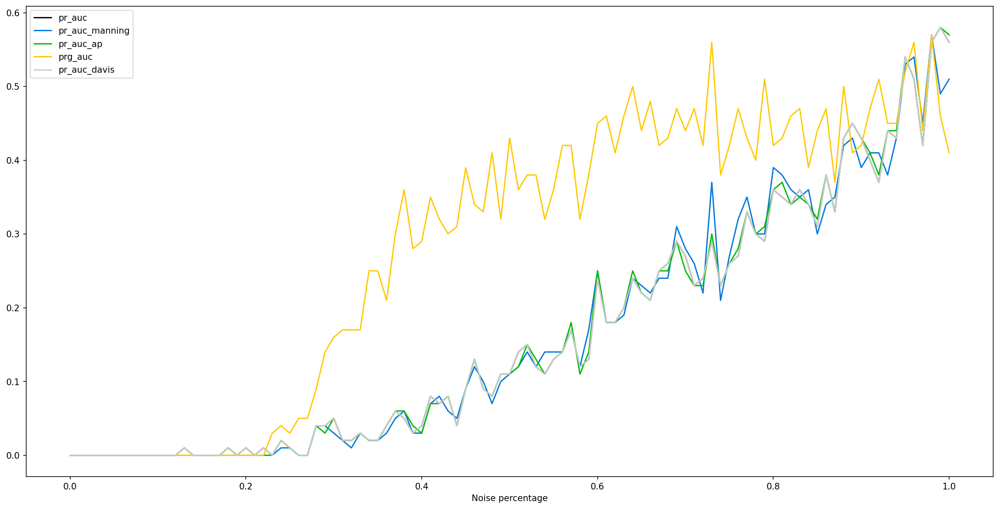

In [ ]:
#1 -- Misclassification Noise

# Heavily imbalanced: IR = 40

scores_c1 = []
scores_c2 = []

misclassified_scores_c1 = []
misclassified_scores_c2 = []

for i in range(100):
  pred_proba_c1, pred_c1, y_test = create_classification(n_samples=1000, random_state=None, class_sep=1.0, n_clusters_per_class=2, weights=[40/41])
  pred_proba_c2, pred_c2 = randomize(pred_proba_c1, pred_c1, y_test, 0.1)

  #Baseline
  scores_c1.append(calc_score(pred_proba_c1, pred_c1, y_test))
  scores_c2.append(calc_score(pred_proba_c2, pred_c2, y_test))

  #Misclassification noise
  temp_c1 = []
  temp_c2 = []
  for j in np.linspace(0,1,101):
    misclassified_y_test = misclassification_noise_random(y_test, j)
    temp_c1.append(calc_score(pred_proba_c1, pred_c1, misclassified_y_test))
    temp_c2.append(calc_score(pred_proba_c2, pred_c2, misclassified_y_test))

  misclassified_scores_c1.append(temp_c1)
  misclassified_scores_c2.append(temp_c2)

print(calc_effect(scores_c1, scores_c2))

#Calculating misclassification noise
misclassification_effect = calc_noise_effect(misclassified_scores_c1, misclassified_scores_c2)

print(misclassification_effect)

#Creating graph for misclassification noise
print_effect_graph(misclassification_effect, misclassification_effect.keys())
print_effect_graph(misclassification_effect, ['brier_losses_inv', 'log_losses_inv', 'F1', 'prg_auc', 'pr_auc_manning', 'hscores'])
print_effect_graph(misclassification_effect, ['pr_auc', 'pr_auc_manning', 'pr_auc_ap', 'prg_auc', 'pr_auc_davis'])

{'F1': 0, 'gmeans': 0, 'roc_auc': 0, 'pr_auc': 0, 'pr_auc_manning': 0, 'pr_auc_ap': 0, 'prg_auc': 0, 'pr_auc_davis': 0, 'cwas': 0, 'kappas': 0, 'mccs': 0, 'hscores': 0, 'brier_losses_inv': 0, 'log_losses_inv': 0}
{'F1': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.01, 0, 0, 0, 0.01, 0.02, 0.02, 0.02, 0.03, 0, 0.01, 0.05, 0.03, 0.09, 0.05, 0.09999999999999999, 0.12999999999999998, 0.16, 0.11999999999999998, 0.18000000000000002, 0.12999999999999998, 0.145, 0.26000000000000006, 0.2800000000000001, 0.2950000000000001, 0.37000000000000016, 0.34000000000000014, 0.4200000000000002, 0.37000000000000016, 0.46000000000000024, 0.5100000000000002, 0.48500000000000026], 'gmeans': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

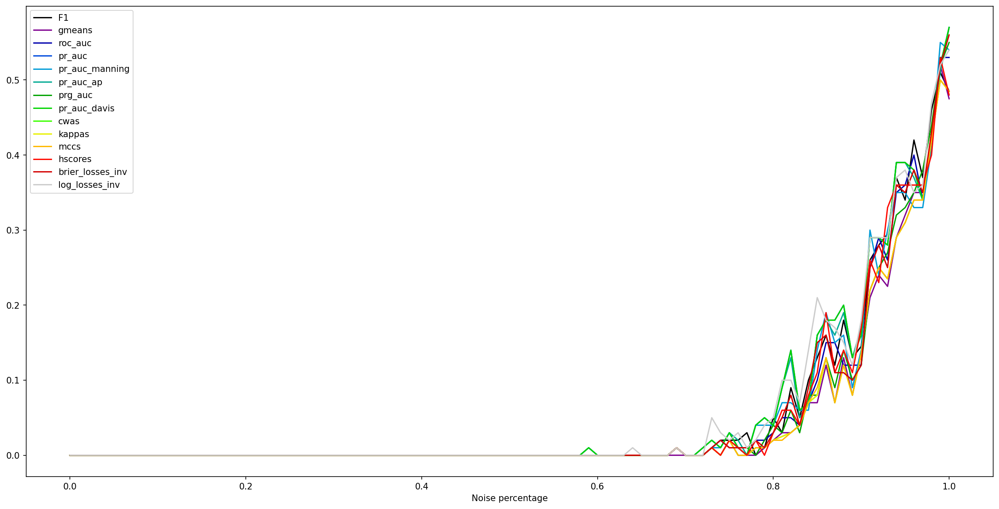

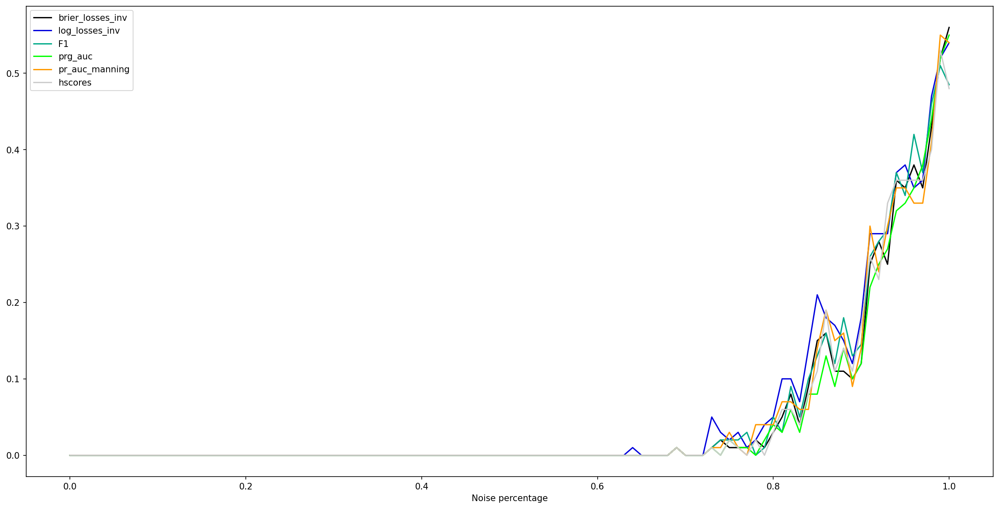

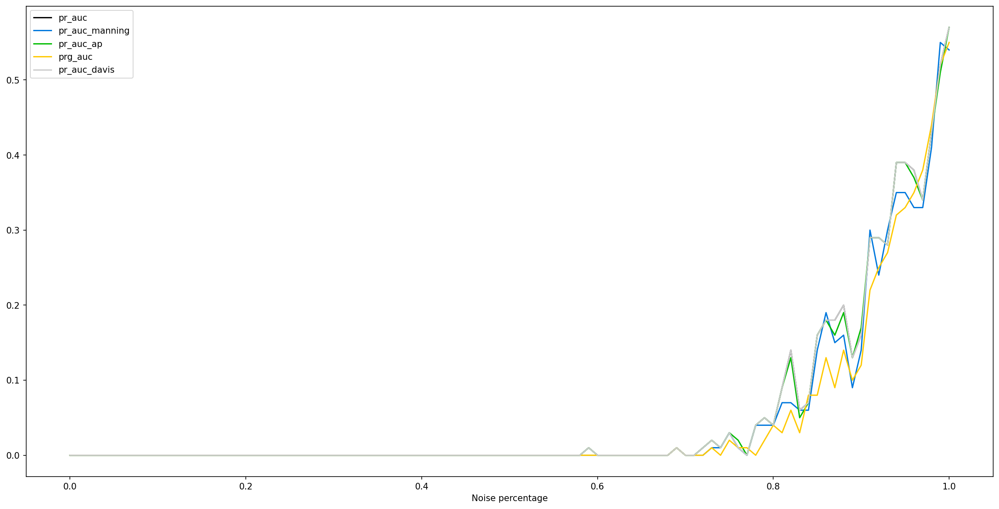

In [ ]:
#1 -- Misclassification Noise

# Balanced data

scores_c1 = []
scores_c2 = []

misclassified_scores_c1 = []
misclassified_scores_c2 = []

for i in range(100):
  pred_proba_c1, pred_c1, y_test = create_classification(n_samples=1000, random_state=None, class_sep=1.0, n_clusters_per_class=2, weights=[0.5])
  pred_proba_c2, pred_c2 = randomize(pred_proba_c1, pred_c1, y_test, 0.1)

  #Baseline
  scores_c1.append(calc_score(pred_proba_c1, pred_c1, y_test))
  scores_c2.append(calc_score(pred_proba_c2, pred_c2, y_test))

  #Misclassification noise
  temp_c1 = []
  temp_c2 = []
  for j in np.linspace(0,1,101):
    misclassified_y_test = misclassification_noise_random(y_test, j)
    temp_c1.append(calc_score(pred_proba_c1, pred_c1, misclassified_y_test))
    temp_c2.append(calc_score(pred_proba_c2, pred_c2, misclassified_y_test))

  misclassified_scores_c1.append(temp_c1)
  misclassified_scores_c2.append(temp_c2)

print(calc_effect(scores_c1, scores_c2))

#Calculating misclassification noise
misclassification_effect = calc_noise_effect(misclassified_scores_c1, misclassified_scores_c2)

print(misclassification_effect)

#Creating graph for misclassification noise
print_effect_graph(misclassification_effect, misclassification_effect.keys())
print_effect_graph(misclassification_effect, ['brier_losses_inv', 'log_losses_inv', 'F1', 'prg_auc', 'pr_auc_manning', 'hscores'])
print_effect_graph(misclassification_effect, ['pr_auc', 'pr_auc_manning', 'pr_auc_ap', 'prg_auc', 'pr_auc_davis'])

In [ ]:
#2 -- Probability Noise

# Slightly imbalanced: IR = 4.5

scores_c1 = []
scores_c2 = []

noise_scores_c1 = []
noise_scores_c2 = []

for i in range(100):
  pred_proba_c1, pred_c1, y_test = create_classification(n_samples=1000, random_state=None, class_sep=1.0, n_clusters_per_class=2, weights=[9/11])
  pred_proba_c2, pred_c2 = randomize(pred_proba_c1, pred_c1, y_test, 0.1)

  #Baseline
  scores_c1.append(calc_score(pred_proba_c1, pred_c1, y_test))
  scores_c2.append(calc_score(pred_proba_c2, pred_c2, y_test))

  #Probability noise
  temp_c1 = []
  temp_c2 = []
  rng = np.random.default_rng()
  for j in np.linspace(0,1,101):
    beta = j*0.5
    alpha = rng.uniform(-beta, beta)

    pred_proba_noise_c1, pred_noise_c1 = probability_noise(pred_proba_c1, pred_c1, beta)
    #pred_proba_noise_c2, pred_noise_c2 = probability_noise(pred_proba_c2, pred_c2, beta)

    temp_c1.append(calc_score(pred_proba_noise_c1, pred_noise_c1, y_test))
    temp_c2.append(calc_score(pred_proba_c2, pred_c2, y_test))


  noise_scores_c1.append(temp_c1)
  noise_scores_c2.append(temp_c2)

print(calc_effect(scores_c1, scores_c2))

#Calculating probability noise
noise_effect = calc_noise_effect(noise_scores_c1, noise_scores_c2)

print(noise_effect)

{'F1': 0, 'gmeans': 0, 'roc_auc': 0, 'pr_auc': 0, 'pr_auc_manning': 0, 'pr_auc_ap': 0, 'prg_auc': 0, 'pr_auc_davis': 0, 'cwas': 0, 'kappas': 0, 'mccs': 0, 'hscores': 0, 'brier_losses_inv': 0, 'log_losses_inv': 0}
{'F1': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.01, 0.02, 0.05, 0.08, 0.15, 0.18000000000000002, 0.2900000000000001, 0.3300000000000001, 0.4300000000000002, 0.5600000000000003, 0.6000000000000003, 0.6900000000000004, 0.7300000000000004, 0.7600000000000005, 0.8100000000000005, 0.8900000000000006, 0.9300000000000006, 0.9500000000000006, 0.9600000000000006, 0.9800000000000006, 0.9800000000000006, 0.9900000000000007, 0.9900000000000007, 0.9900000000000007, 0.9900000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007

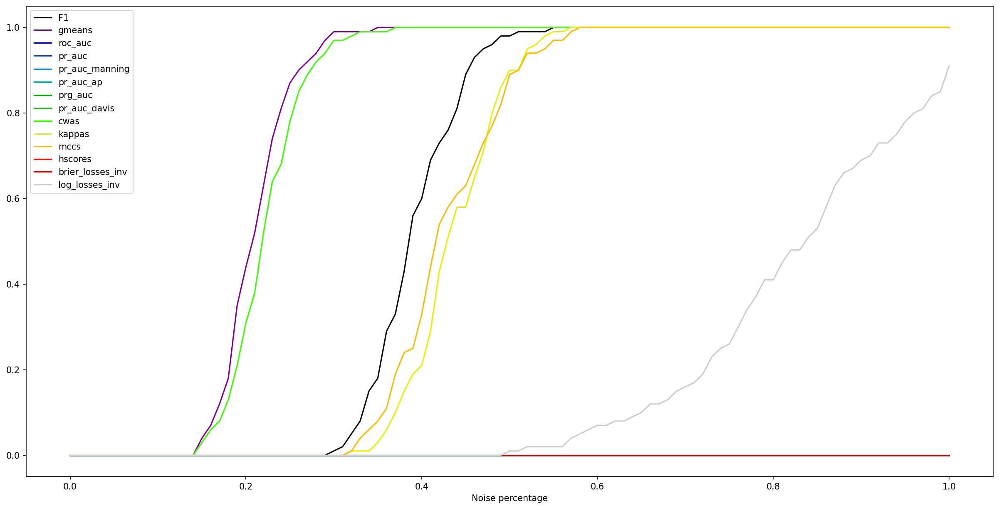

In [ ]:
#Creating graph for probability noise
print_effect_graph(noise_effect, noise_effect.keys())

{'F1': 0, 'gmeans': 0, 'roc_auc': 0, 'pr_auc': 0, 'pr_auc_manning': 0, 'pr_auc_ap': 0, 'prg_auc': 0, 'pr_auc_davis': 0, 'cwas': 0, 'kappas': 0, 'mccs': 0, 'hscores': 0, 'brier_losses_inv': 0, 'log_losses_inv': 0}
{'F1': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.01, 0.01, 0.02, 0.02, 0.02, 0.03, 0.02, 0.07, 0.09, 0.11499999999999999, 0.13999999999999999, 0.15, 0.19000000000000003, 0.25000000000000006, 0.2800000000000001, 0.3300000000000001, 0.38000000000000017, 0.4400000000000002, 0.5300000000000002, 0.5750000000000003, 0.6100000000000003, 0.6800000000000004, 0.7300000000000004, 0.7600000000000005, 0.7900000000000005, 0.8000000000000005, 0.8400000000000005, 0.8800000000000006, 0.9000000000000006, 0.9600000000000006, 0.9600000000000006, 0.9800000000000006, 0.9800000000000006, 0.9800000000000006, 0.9800000000000006, 0.9900000000000007, 1.0000000000000007, 1.0000000000000007, 1.0000000000000007, 1.000000000000

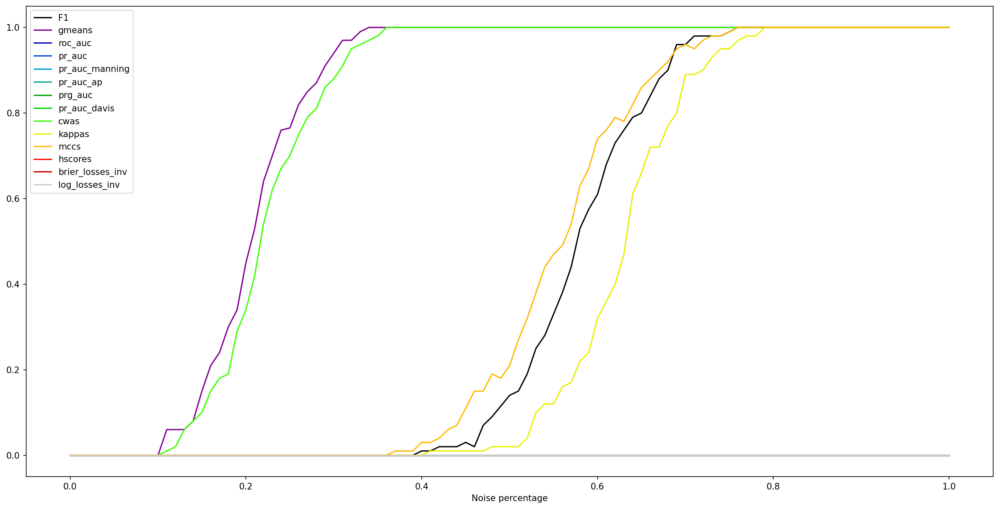

In [ ]:
#2 -- Probability Noise

# Moderately imbalanced: IR = 11

scores_c1 = []
scores_c2 = []

noise_scores_c1 = []
noise_scores_c2 = []

for i in range(100):
  pred_proba_c1, pred_c1, y_test = create_classification(n_samples=1000, random_state=None, class_sep=1.0, n_clusters_per_class=2, weights=[11/12])
  pred_proba_c2, pred_c2 = randomize(pred_proba_c1, pred_c1, y_test, 0.1)

  #Baseline
  scores_c1.append(calc_score(pred_proba_c1, pred_c1, y_test))
  scores_c2.append(calc_score(pred_proba_c2, pred_c2, y_test))

  #Probability noise
  temp_c1 = []
  temp_c2 = []
  rng = np.random.default_rng()
  for j in np.linspace(0,1,101):
    beta = j*0.5
    alpha = rng.uniform(-beta, beta)

    pred_proba_noise_c1, pred_noise_c1 = probability_noise(pred_proba_c1, pred_c1, beta)
    #pred_proba_noise_c2, pred_noise_c2 = probability_noise(pred_proba_c2, pred_c2, beta)

    temp_c1.append(calc_score(pred_proba_noise_c1, pred_noise_c1, y_test))
    temp_c2.append(calc_score(pred_proba_c2, pred_c2, y_test))


  noise_scores_c1.append(temp_c1)
  noise_scores_c2.append(temp_c2)

print(calc_effect(scores_c1, scores_c2))

#Calculating probability noise
noise_effect = calc_noise_effect(noise_scores_c1, noise_scores_c2)

print(noise_effect)

#Creating graph for probability noise
print_effect_graph(noise_effect, noise_effect.keys())

{'F1': 0, 'gmeans': 0, 'roc_auc': 0, 'pr_auc': 0, 'pr_auc_manning': 0, 'pr_auc_ap': 0, 'prg_auc': 0, 'pr_auc_davis': 0, 'cwas': 0, 'kappas': 0, 'mccs': 0, 'hscores': 0, 'brier_losses_inv': 0, 'log_losses_inv': 0}
{'F1': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.01, 0.01, 0.01, 0.01, 0.01, 0, 0, 0.01, 0.01, 0.02, 0.02, 0.02, 0.03, 0.03, 0.04, 0.03, 0.060000000000000005, 0.060000000000000005, 0.07, 0.08, 0.09, 0.09, 0.09, 0.09999999999999999, 0.11499999999999999, 0.13499999999999998, 0.17500000000000002, 0.20500000000000004, 0.25000000000000006, 0.25500000000000006, 0.2900000000000001, 0.3300000000000001, 0.36000000000000015, 0.4100000000000002, 0.4400000000000002, 0.47000000000000025, 0.5100000000000002, 0.5200000000000002, 0.5700000000000003, 0.6000000000000003, 0.6400000000000003, 0.6500000000000004, 0.7100000000000004, 0.7500000000000004, 0.8200000000000005, 0.8450000000000005, 0.920000000

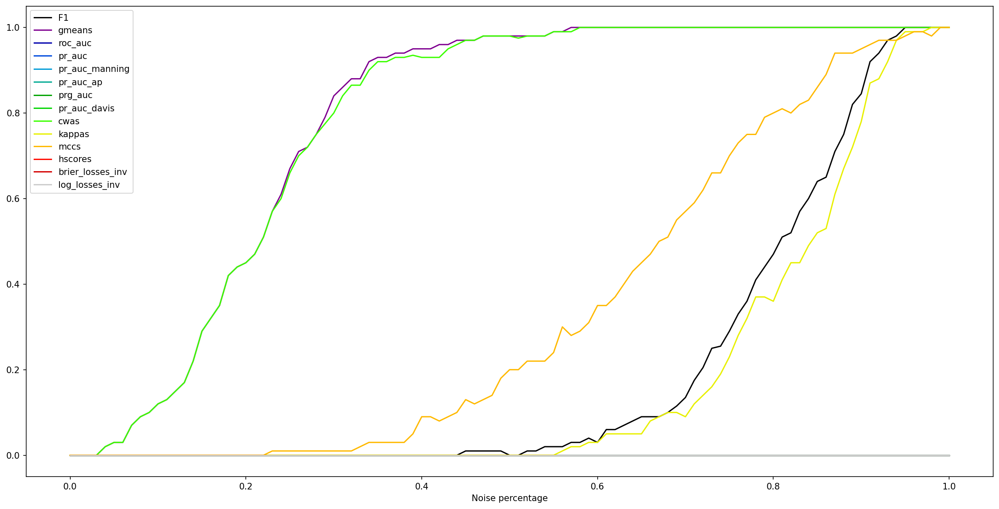

In [ ]:
#2 -- Probability Noise

# Heavily imbalanced: IR = 40

scores_c1 = []
scores_c2 = []

noise_scores_c1 = []
noise_scores_c2 = []

for i in range(100):
  pred_proba_c1, pred_c1, y_test = create_classification(n_samples=1000, random_state=None, class_sep=1.0, n_clusters_per_class=2, weights=[40/41])
  pred_proba_c2, pred_c2 = randomize(pred_proba_c1, pred_c1, y_test, 0.1)

  #Baseline
  scores_c1.append(calc_score(pred_proba_c1, pred_c1, y_test))
  scores_c2.append(calc_score(pred_proba_c2, pred_c2, y_test))

  #Probability noise
  temp_c1 = []
  temp_c2 = []
  rng = np.random.default_rng()
  for j in np.linspace(0,1,101):
    beta = j*0.5
    alpha = rng.uniform(-beta, beta)

    pred_proba_noise_c1, pred_noise_c1 = probability_noise(pred_proba_c1, pred_c1, beta)
    #pred_proba_noise_c2, pred_noise_c2 = probability_noise(pred_proba_c2, pred_c2, beta)

    temp_c1.append(calc_score(pred_proba_noise_c1, pred_noise_c1, y_test))
    temp_c2.append(calc_score(pred_proba_c2, pred_c2, y_test))


  noise_scores_c1.append(temp_c1)
  noise_scores_c2.append(temp_c2)

print(calc_effect(scores_c1, scores_c2))

#Calculating probability noise
noise_effect = calc_noise_effect(noise_scores_c1, noise_scores_c2)

print(noise_effect)

#Creating graph for probability noise
print_effect_graph(noise_effect, noise_effect.keys())